title: Debt Collection Agency Performance Analysis V3  
author: Jesse Scherwitz  
date: 2023-08-01  
region: EU  
link: https://docs.google.com/presentation/d/1J4fEQAx2EVp5BbTf8rw4zKulLKsxT2trZ2sTAKcZoco/edit#slide=id.p  
tags: DCA, debt_collection, collection, dunning, pair, coeo, germany, recovery_rate, cohorts, overdraft, credit  
summary: We look into recovery rates, share of recovered cases and speed of action and compare 2 debt collection agencies in the German Market (pair vs coeo, formerly knp) over a timeframe of up to 24 months to decide which agency we should partner with. Primary goal is to maximise € recoveries resulting from writeoffs from all types of defaulting customers (all debt types / credit products considered). Pair shows the highest recovery rate (e.g. on most quarterly and monthly cohorts, as well as in total). This is mostly driven by high performance on the larger debt buckets >2500€ (Overdraft / CC). Pair also recovers first payments per case faster than coeo. Share of recovered cases is slightly lower than for coeo. Solely based on the considered metrics, our overall recommendation is therefore still (like in prevous analyses) to go with pair, but there are also other aspects (business continuity) to consider.

In [ ]:
!pip install seaborn

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import os
import seaborn as sns
from collections import Counter

Matplotlib is building the font cache; this may take a moment.


# Recovery Payment Data comes from S3.
### Agencies send us csv files once a month containing customers' payments.
### Go to
### n26-etl/@data_uploads/debt_collection/Bestandsbericht
### on S3 and download the files you would like to analyse.

In [13]:
parent = "fra/live/pair_vs_coeo_2023_update/"
# original analysis:
# parent = 'fra/live/pair_vs_coeo/

files = os.listdir(parent)

In [14]:
files

['.DS_Store',
 'COEO_Bestandsbericht_2022-04 - COEO_Bestandsbericht_2022-04.csv',
 'COEO_Bestandsbericht_2022-05 - COEO_Bestandsbericht_2022-05 (1).csv',
 'COEO_Bestandsbericht_2022-06.csv',
 'COEO_Bestandsbericht_2022-07.csv',
 'COEO_Bestandsbericht_2022-08 - COEO_Bestandsbericht_2022-08.csv',
 'COEO_Bestandsbericht_2022-09 - COEO_Bestandsbericht_2022-09.csv',
 'COEO_Bestandsbericht_2022-10 - COEO_Bestandsbericht_2022-10.csv',
 'COEO_Bestandsbericht_2022-11 - COEO_Bestandsbericht_2022-11 13.53.08.csv',
 'COEO_Bestandsbericht_2022-12 - COEO_Bestandsbericht_2022-12.csv',
 'COEO_Bestandsbericht_2023-01 - 2023-02-13.csv',
 'COEO_Bestandsbericht_2023-02 - COEO_Bestandsbericht_2023-02.csv',
 'COEO_Bestandsbericht_2023-03 - COEO_Bestandsbericht_2023-03.csv',
 'COEO_Bestandsbericht_2023-04 - COEO_Bestandsbericht_2023-04.csv',
 'COEO_Bestandsbericht_2023-05 - COEO_Bestandsbericht_2023-05.csv',
 'COEO_Bestandsbericht_2023-06 - COEO_Bestandsbericht_2023-06.csv',
 'PAIR_MID',
 'PAIR_NEW',
 'PAIR_

## [DATA CHECKS] Import files, check for column name correctness, dups, etc

In [15]:
def import_data(parent=parent, delimiter=","):
    """Imports data from set of csv's on path. Returns 2 dfs for coeo and pair."""

    files = os.listdir(parent)

    # expected set of columns
    test = [
        "collection_id",
        "mandant",
        "order_number",
        "reason",
        "user_id",
        "claim_number",
        "phase",
        "handover_date",
        "collection_status",
        "action",
        "main_claim_handover",
        "main_claim_basis",
        "is_instalment_plan",
        "instalment_status",
        "instalment_agreed_n",
        "instalment_agreed_amount",
        "main_claim_payment",
        "main_claim_open",
        "payment_date",
        "main_claim_payment_accumulated",
    ]

    coeo = pd.DataFrame({})
    pair = pd.DataFrame({})

    for file in files:
        if file.endswith("csv"):
            # pair files have ; delimiter sadge
            if file[:4].lower() == "pair":
                y = pd.read_csv(parent + file, delimiter=delimiter)
            else:
                y = pd.read_csv(parent + file)

            y.columns = y.columns.str.lower().str.replace("-", "_")

            if "claimnumber" in y.columns:
                y = y.rename(columns={"claimnumber": "claim_number"})

            # print(y.columns == test)
            # print(y.columns)

            y["file_name"] = file

            if file[:4].lower() == "pair":
                pair = pd.concat([pair, y])

            elif file[:4].lower() == "coeo":
                coeo = pd.concat([coeo, y])

    coeo["agency"] = "coeo"
    pair["agency"] = "pair"

    return coeo, pair

In [16]:
coeo, pair = import_data()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  """Entry point for launching an IPython kernel.


## Check file row counts

In [23]:
def print_file_row_counts(coeo, pair):
    """To check if row counts look reasonable and that all files are there."""

    print(coeo.groupby(by="file_name").size())
    print(pair.groupby(by="file_name").size())

In [22]:
print_file_row_counts(coeo, pair)

file_name
COEO_Bestandsbericht_2022-04 - COEO_Bestandsbericht_2022-04.csv             171125
COEO_Bestandsbericht_2022-05 - COEO_Bestandsbericht_2022-05 (1).csv           1468
COEO_Bestandsbericht_2022-06.csv                                              1775
COEO_Bestandsbericht_2022-07.csv                                              1507
COEO_Bestandsbericht_2022-08 - COEO_Bestandsbericht_2022-08.csv               1613
COEO_Bestandsbericht_2022-09 - COEO_Bestandsbericht_2022-09.csv               3582
COEO_Bestandsbericht_2022-10 - COEO_Bestandsbericht_2022-10.csv               1421
COEO_Bestandsbericht_2022-11 - COEO_Bestandsbericht_2022-11 13.53.08.csv      1356
COEO_Bestandsbericht_2022-12 - COEO_Bestandsbericht_2022-12.csv                916
COEO_Bestandsbericht_2023-01 - 2023-02-13.csv                                 2450
COEO_Bestandsbericht_2023-02 - COEO_Bestandsbericht_2023-02.csv               2897
COEO_Bestandsbericht_2023-03 - COEO_Bestandsbericht_2023-03.csv              

In [30]:
# run this to see which files contain dups.
# Counter(pair[pair.duplicated()].file_name)
# Counter(coeo[coeo.duplicated()].file_name)


def deduper(coeo, pair):
    """RM dups from input."""

    dups_coeo = len(coeo[coeo.duplicated()])
    dups_pair = len(pair[pair.duplicated()])
    coeo = coeo[~coeo.duplicated()]
    pair = pair[~pair.duplicated()]

    print(
        dups_coeo,
        "and",
        dups_pair,
        "rows removed from coeo, pair files respectively...",
    )

    return coeo, pair


coeo, pair = deduper(coeo, pair)

1 and 15 removed from coeo, pair files respectively...


## Combine the files
### Get all_data here!

In [91]:
all_data = pd.concat([coeo, pair], ignore_index=True)

In [92]:
all_data = all_data.rename(
    columns={"reason": "debt_type", "main_claim_handover": "amount"}
)
all_data = all_data[all_data.handover_date >= "2021-07-22"]

In [93]:
# 1 error in data
all_data = all_data[all_data.handover_date <= all_data.payment_date]

### check if we have the same time periods. [Looks good]

In [94]:
all_data[["payment_date", "agency"]].fillna("").groupby("agency").max()

,payment_date
agency,
coeo,2023-06-30
pair,2023-06-30


In [95]:
end_ts = "2023-06-30"

In [96]:
all_data = all_data[all_data.payment_date <= end_ts]

In [97]:
all_data[["payment_date", "agency"]].fillna("2099").groupby("agency").min()

,payment_date
agency,
coeo,2021-07-23
pair,2021-07-27


In [98]:
all_data = all_data.reset_index(drop=True)

In [99]:
all_data["payment_date"] = pd.to_datetime(all_data["payment_date"])
all_data["handover_date"] = pd.to_datetime(all_data["handover_date"])

## Some Plot/Color functions

In [41]:
def hex_to_RGB(hex):
    # Pass 16 to the integer function for change of base
    return [int(hex[i : i + 2], 16) for i in range(1, 6, 2)]


def agency_colors(hex_coeo="#468499", hex_pair="#F1C40F"):
    """Return dictionary with RBG colors for each agency."""

    color_map = {
        "coeo": tuple(np.array(hex_to_RGB(hex_coeo)) / 255),
        "pair": tuple(np.array(hex_to_RGB(hex_pair)) / 255),
    }
    return color_map


def get_list_of_colors_from_cmap(n, colormap="tab20c"):
    cmap = mpl.cm.get_cmap(colormap)

    colors = [cmap(k)[:3] for k in range(n)]

    return colors

In [42]:
color_map = agency_colors("#468499", "#ffa500")

color_tuple = tuple(color_map.values())

<AxesSubplot:xlabel='payment_date', ylabel='agency'>

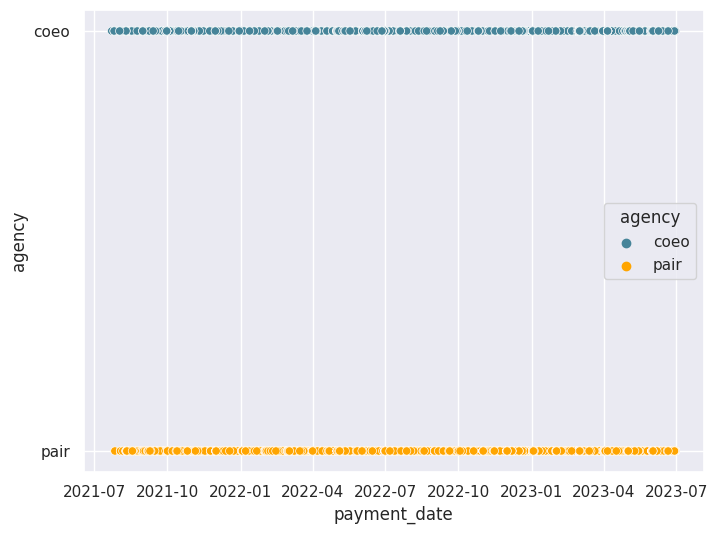

In [43]:
sns.set(rc={"figure.figsize": (8, 6)})
sns.scatterplot(
    data=all_data[["payment_date", "agency"]],
    x="payment_date",
    y="agency",
    hue="agency",
    palette=color_map,
)

# Handover Data. Comes from DWH
### We look at handovers up until 2023-04-01 such that the youngest cohort has at least 3 months to act.

In [50]:
"""
select
    dwh_dunning_handovers.*
from dwh_dunning_handovers
inner join etl_reporting.cmd_address as addr
    on dwh_dunning_handovers.user_id = addr.user_id
    and addr."type" = 'SHIPPING'
    and addr.country = 'DEU'
where true
  and dwh_dunning_handovers.created > '2021-07-22'
  and agency in ('pair', 'coeo')
  and dwh_dunning_handovers.created < '2023-04-01'
;
"""

'\nselect\n    dwh_dunning_handovers.*\nfrom dwh_dunning_handovers\ninner join etl_reporting.cmd_address as addr\n    on dwh_dunning_handovers.user_id = addr.user_id\n    and addr."type" = \'SHIPPING\'\n    and addr.country = \'DEU\'\nwhere true\n  and dwh_dunning_handovers.created > \'2021-07-22\'\n  and agency in (\'pair\', \'coeo\')\n  and dwh_dunning_handovers.created < \'2023-04-01\'\n;\n'

In [52]:
users = pd.read_csv(parent + "handovers/coeo_pair_2y.csv")

### There are a few dups which we remove

In [59]:
users = users.drop_duplicates(subset="collection_id", keep="first")

In [60]:
users = users[users.created <= end_ts]
users["created_date"] = users["created"].astype(str).str[:10]
users["created_date"] = pd.to_datetime(users["created_date"])
users["created"] = pd.to_datetime(users["created"])

Text(0.5, 0, 'Handover Date')

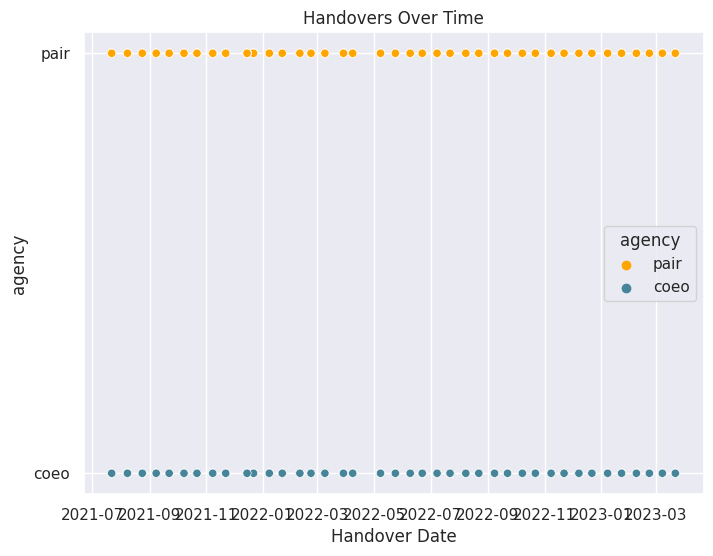

In [61]:
sns.scatterplot(
    data=users[["created_date", "agency"]],
    x="created_date",
    y="agency",
    hue="agency",
    palette=color_map,
).set(title="Handovers Over Time")
plt.xlabel("Handover Date")

In [62]:
# to make cohort plots nicer
users["created_date"] = users["created_date"].astype(str).str[:10]

## Makes groups exactly equal in size


In [63]:
agg_users = users[["collection_id", "agency"]].groupby(by="agency").size()

In [64]:
diff = agg_users["pair"] - agg_users["coeo"]
diff

87

In [65]:
if diff > 0:
    users = users[
        ~users.index.isin(list(users[users.agency == "pair"].sample(diff).index))
    ]
if diff < 0:
    users = users[
        ~users.index.isin(list(users[users.agency == "coeo"].sample(abs(diff)).index))
    ]

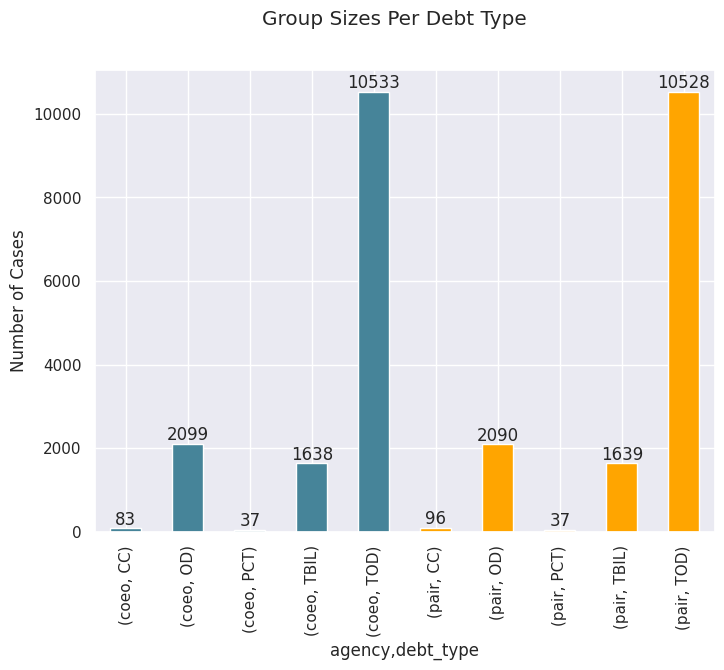

In [66]:
y = users.groupby(by=["agency", "debt_type"]).size()


fig, ax = plt.subplots(nrows=1, ncols=1)

y.plot(
    kind="bar", color=pd.Series([y.index[k][0] for k in range(len(y))]).map(color_map)
)
for container in ax.containers:
    ax.bar_label(container)

# ax.legend(labels=('coeo', 'coeo', 'pair', 'pair'))
ax.set_ylabel("Number of Cases")
fig.suptitle("Group Sizes Per Debt Type")
plt.show()

In [115]:
## save users to have constant results
users.to_csv(parent + "handovers/users_20230801.csv")

## ... read users from file here ...

## Assign amounts to buckets and sort them

In [68]:
def bucket_mapping(x):
    if x < 30:
        bucket = 0
    elif x < 100:
        bucket = 1
    elif x < 500:
        bucket = 2
    elif x < 2500:
        bucket = 3
    elif x < 10000:
        bucket = 4
    else:
        bucket = 5

    return bucket

In [69]:
buckets = [
    "[10, 30)",
    "[30, 100)",
    "[100, 500)",
    "[500, 2500)",
    "[2500, 10000)",
    "≥ 10000",
]

In [70]:
bucket_dict = {i: bucket for i, bucket in enumerate(buckets)}

In [71]:
users["bucket"] = users.amount.apply(bucket_mapping)

In [72]:
aggregated = (
    users[["agency", "bucket", "amount"]]
    .groupby(by=["agency", "bucket"])
    .size()
    .unstack(level=-1)
)

In [73]:
### THIS!!!
aggregated = aggregated.rename(columns=bucket_dict)

## Counts by Bucket

In [74]:
cols = get_list_of_colors_from_cmap(6, "Accent")

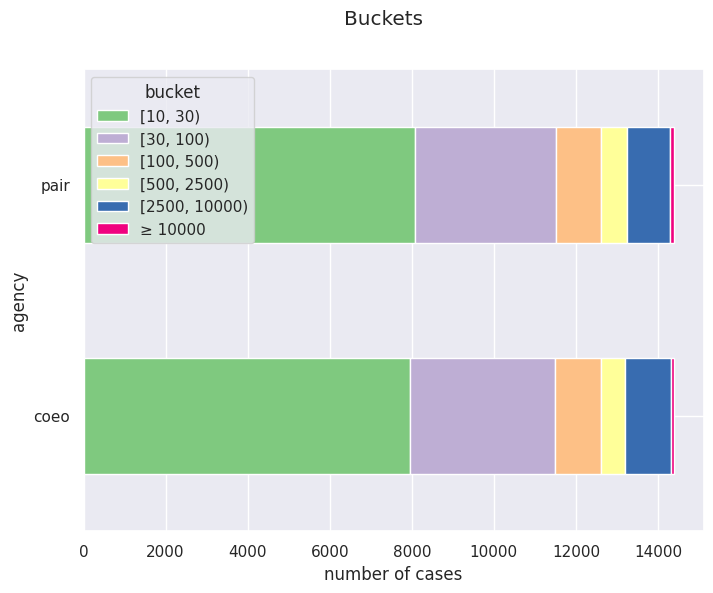

In [75]:
fig, ax = plt.subplots(nrows=1, ncols=1)

aggregated.plot(kind="barh", stacked=True, ax=ax, color=cols)

ax.set_xlabel("number of cases")
fig.suptitle("Buckets")
plt.show()

In [76]:
for_share = aggregated.stack().reset_index(name="cnt")

In [77]:
share_below_hundred_eur = (
    for_share[for_share["bucket"].isin(["[10, 30)", "[30, 100)"])].cnt.sum()
    / for_share.cnt.sum()
)
share_below_hundred_eur

0.8000347463516331

## Amounts by Bucket

In [78]:
aggregated_amt = (
    users[["agency", "bucket", "amount"]]
    .groupby(by=["agency", "bucket"])
    .sum()
    .unstack(level=-1)
)
aggregated_amt = aggregated_amt.rename(columns=bucket_dict)

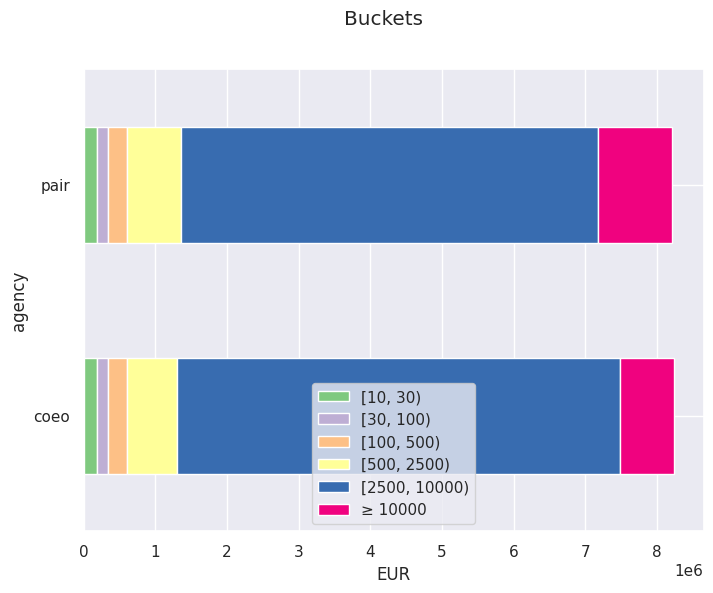

In [79]:
fig, ax = plt.subplots(nrows=1, ncols=1)

aggregated_amt.plot(kind="barh", stacked=True, ax=ax, color=cols)

ax.set_xlabel("EUR")
ax.set_xlabel("EUR")
ax.legend(labels=buckets)
fig.suptitle("Buckets")
plt.show()

In [80]:
for_share_amt = aggregated_amt.stack().reset_index()

In [81]:
for_share_amt_two_largest_buckets = (
    for_share_amt[
        for_share_amt["bucket"].isin(["[2500, 10000)", "≥ 10000"])
    ].amount.sum()
    / for_share_amt.amount.sum()
)
for_share_amt_two_largest_buckets

0.8379314578121648

In [82]:
for_share_amt_three_largest_buckets = (
    for_share_amt[
        for_share_amt["bucket"].isin(["[500, 2500)", "[2500, 10000)", "≥ 10000"])
    ].amount.sum()
    / for_share_amt.amount.sum()
)
for_share_amt_three_largest_buckets

0.9256841703488581

## Handover Cohorts

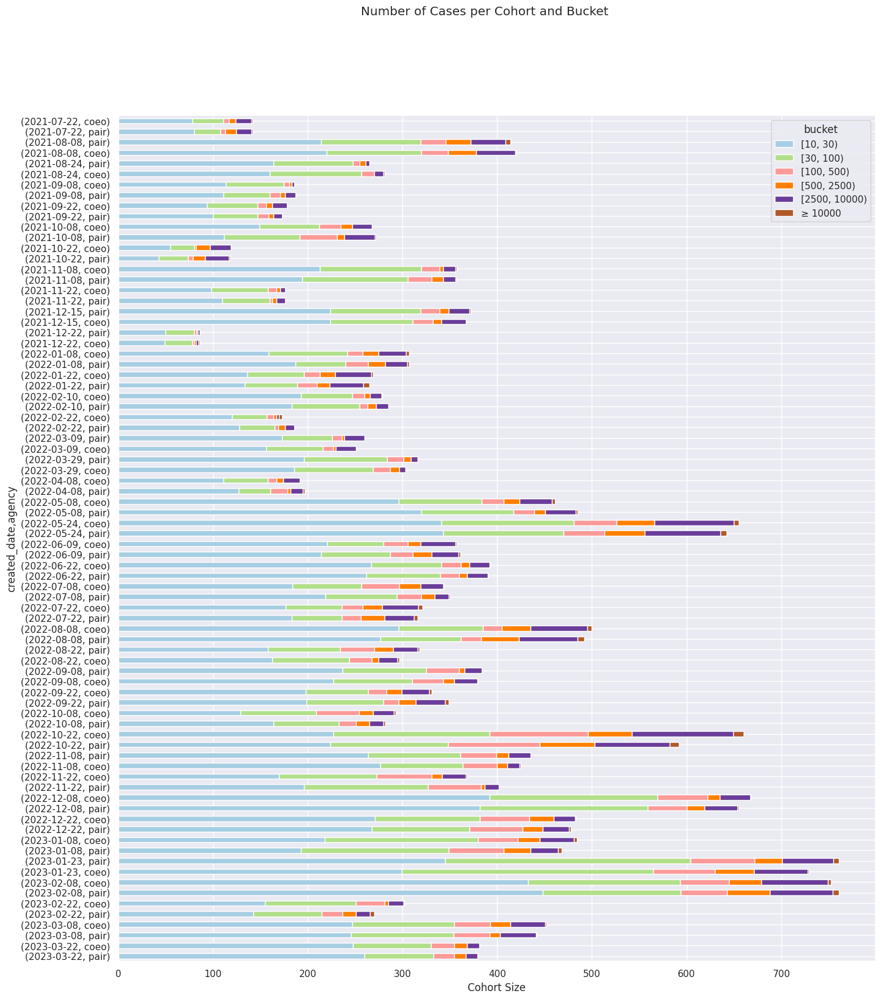

In [85]:
cohort_sizes = (
    users[["agency", "bucket", "amount", "created_date"]]
    .groupby(by=["created_date", "agency", "bucket"])
    .size()
    .unstack(level=-1)
)
cohort_sizes = cohort_sizes.rename(columns=bucket_dict)


fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16, 18))
cohort_sizes.sort_values(by="created_date", ascending=False).plot(
    kind="barh", ax=ax, stacked=True, colormap="Paired"
)
ax.set_xlabel("Cohort Size")

fig.suptitle("Number of Cases per Cohort and Bucket")
plt.show()

In [86]:
aggregated_cohorts = (
    users[["agency", "bucket", "amount", "created_date"]]
    .groupby(by=["created_date", "agency", "bucket"])
    .sum()
    .unstack(level=-1)
)
aggregated_cohorts = aggregated_cohorts.rename(columns=bucket_dict)

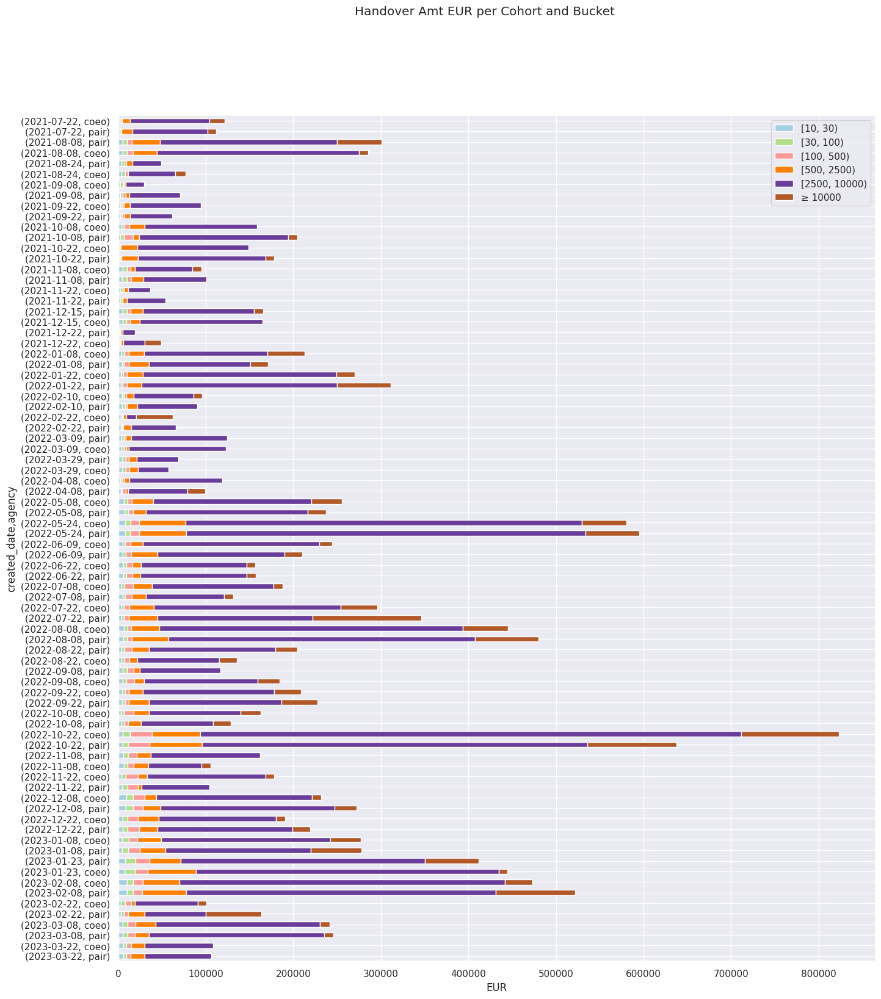

In [88]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16, 18))
aggregated_cohorts.sort_values(by="created_date", ascending=False).plot(
    kind="barh", ax=ax, stacked=True, colormap="Paired"
)
ax.set_xlabel("EUR")
ax.legend(labels=buckets)
fig.suptitle("Handover Amt EUR per Cohort and Bucket")
plt.show()

# Merge Transactions with Handover Data 
### To get Germans only.

#### This merge produces a handful of duplicates for TBIL which need to be removed


In [100]:
all_data = pd.merge(all_data, users, on=["user_id", "agency", "amount"], how="inner")

## Rm negative payments

In [102]:
all_data = all_data[all_data["main_claim_payment"] > 0]

## Distribution & Outliers

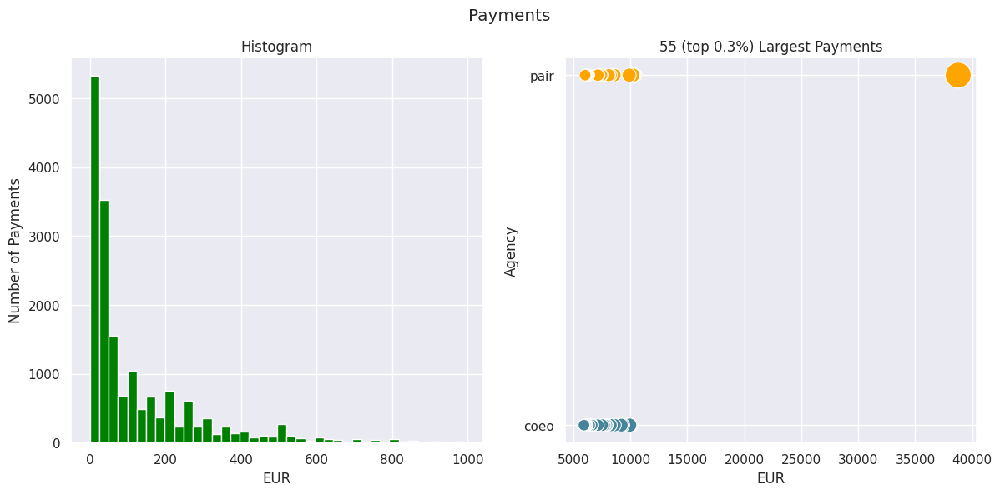

In [103]:
x = 0.003

# LARGEST PAYMENTS


y = all_data[["main_claim_payment", "agency", "user_id"]]


n = len(
    y[y.main_claim_payment >= y.main_claim_payment.quantile(1 - x)].sort_values(
        by="main_claim_payment", ascending=False
    )
)
largest_recoveries = y[
    y.main_claim_payment >= y.main_claim_payment.quantile(1 - x)
].sort_values(by="main_claim_payment", ascending=False)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))


all_data["main_claim_payment"][all_data["main_claim_payment"] < 1000].hist(
    bins=40, color="green", ax=ax[0]
)


sns.set(rc={"figure.figsize": (8, 6)})
g = sns.scatterplot(
    data=largest_recoveries[["main_claim_payment", "agency"]],
    x="main_claim_payment",
    y="agency",
    hue="agency",
    size="main_claim_payment",
    sizes=(100, 500),
    palette=color_map,
    ax=ax[1],
)
plt.title("Top 0.5% Largest Payments")
plt.legend([], frameon=False)

ax[0].set_xlabel("EUR")
ax[1].set_xlabel("EUR")
ax[0].set_ylabel("Number of Payments")
ax[1].set_ylabel("Agency")
ax[0].set_title("Histogram")
ax[1].set_title(f"{n} (top {x*100}%) Largest Payments")
fig.suptitle("Payments")
plt.show()

## Fully recovered cases

In [104]:
fully_recovered = all_data[
    (all_data["amount"] == all_data["main_claim_payment_accumulated"])
]

In [105]:
fully_recovered_deduped = fully_recovered.drop_duplicates(
    subset="claim_number", keep="first"
)

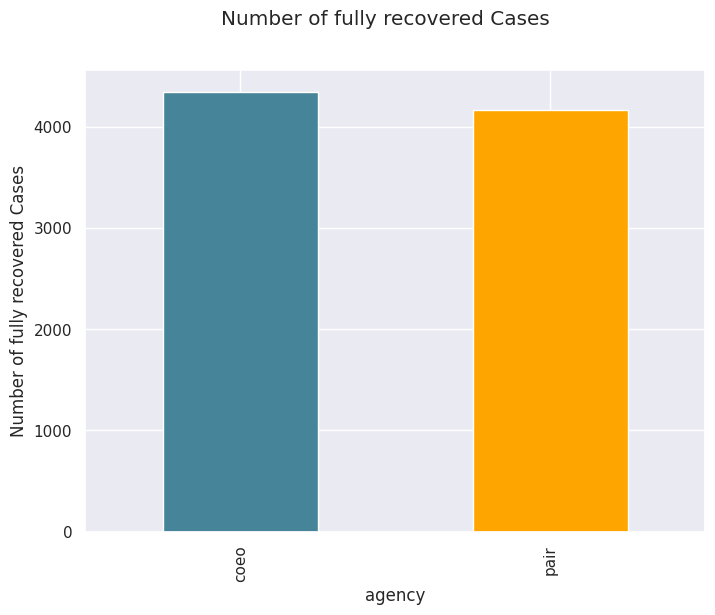

In [106]:
# fully recovered cases

fig, ax = plt.subplots(nrows=1, ncols=1)

y = fully_recovered_deduped[["agency", "payment_date"]].groupby(by="agency").size()
y.plot(kind="bar", color=y.index.map(color_map))

ax.set_ylabel("Number of fully recovered Cases")
fig.suptitle("Number of fully recovered Cases")
plt.show()

In [107]:
recoveries = (
    all_data[["main_claim_payment", "agency"]].groupby("agency").sum().squeeze()
)
fully_recovered = all_data[
    (all_data["amount"] == all_data["main_claim_payment_accumulated"])
]
handover_agg = users[["amount", "agency"]].groupby(by="agency").sum()
handover_agg_cnt = users.groupby(by="agency").size().to_frame("cohort_size")
rates = pd.merge(handover_agg, recoveries, on="agency", how="inner")
rates["recovery_rate"] = rates.main_claim_payment / rates.amount * 100.0

In [108]:
fully_recovered_deduped = (
    fully_recovered_deduped[["agency", "payment_date"]]
    .groupby(by="agency")
    .size()
    .to_frame("recovered_cases")
)

In [109]:
rates_cases = pd.merge(
    handover_agg_cnt, fully_recovered_deduped, on="agency", how="inner"
)
rates_cases["share_recovered_cases"] = (
    rates_cases.recovered_cases / rates_cases.cohort_size * 100.0
)

In [110]:
color_map_int = color_map

In [111]:
color_map["1"] = color_map["coeo"]
color_map["2"] = color_map["pair"]

2


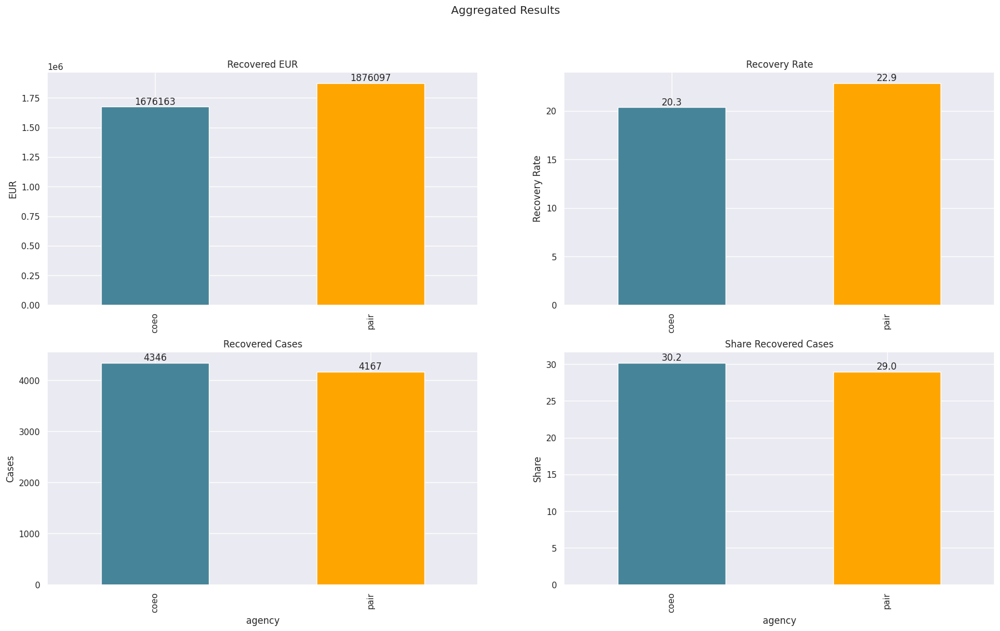

In [112]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(22, 12))


recoveries.plot(kind="bar", color=recoveries.index.map(color_map), ax=ax[0][0])
rates["recovery_rate"].plot(kind="bar", color=y.index.map(color_map), ax=ax[0][1])
rates_cases["recovered_cases"].plot(
    kind="bar", color=y.index.map(color_map), ax=ax[1][0]
)
rates_cases["share_recovered_cases"].plot(
    kind="bar", color=y.index.map(color_map), ax=ax[1][1]
)


print(len(ax))


for k, container in enumerate(ax[0][0].containers):
    ax[0][0].bar_label(container, color=color_map.get(k), fmt="%.0f")

for k, container in enumerate(ax[0][1].containers):
    ax[0][1].bar_label(container, color=color_map.get(k), fmt="%.1f")

for k, container in enumerate(ax[1][0].containers):
    ax[1][0].bar_label(container, color=color_map.get(k), fmt="%.0f")

for k, container in enumerate(ax[1][1].containers):
    ax[1][1].bar_label(container, color=color_map.get(k), fmt="%.1f")


ax[0][0].set_ylabel("EUR")
ax[0][1].set_ylabel("Recovery Rate")
ax[1][0].set_ylabel("Cases")
ax[1][1].set_ylabel("Share")

ax[0][0].set_xlabel("")
ax[0][1].set_xlabel("")


ax[0][0].set_title("Recovered EUR")
ax[0][1].set_title("Recovery Rate")
ax[1][0].set_title("Recovered Cases")
ax[1][1].set_title("Share Recovered Cases")


fig.suptitle("Aggregated Results")
plt.show()

In [114]:
## save all_data in case you want to replicate
all_data.to_csv(parent + "all_data_saved/all_data_20230801.csv")

## First Payment, Complete Payment

In [116]:
all_data["days_diff"] = (all_data["payment_date"] - all_data["handover_date"]).dt.days

In [117]:
first_payment = (
    all_data[["agency", "user_id", "days_diff", "amount", "debt_type_y"]]
    .groupby(by=["agency", "user_id", "amount", "debt_type_y"])
    .min()
    .reset_index()
)

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: Legend does not support <AxesSubplot:title={'center':'coeo'}, xlabel='days'> instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: Legend does not support <AxesSubplot:title={'center':'pair'}, xlabel='days'> instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  # This is added back by InteractiveShellApp.init_path()


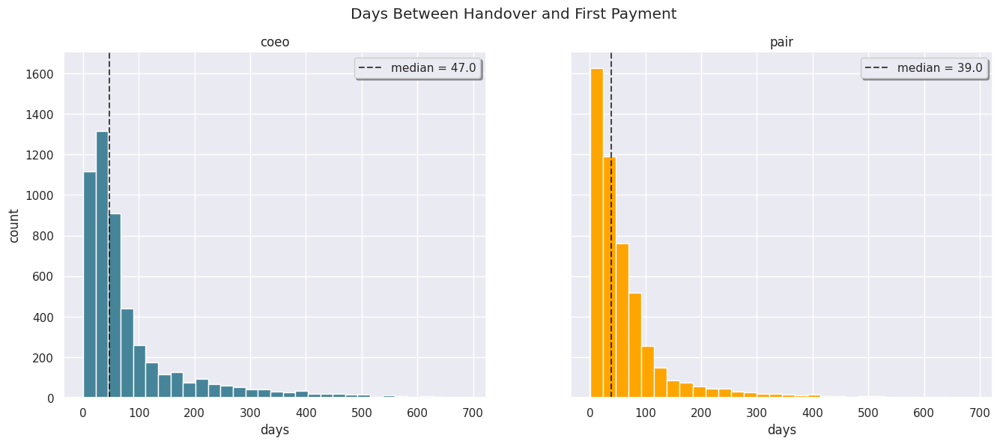

In [118]:
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True, figsize=(16, 6))
k = 0

for ag in sorted(list(set(first_payment.agency))):
    median = round(first_payment[first_payment.agency == ag]["days_diff"].median(), 2)
    hist = first_payment[first_payment.agency == ag]["days_diff"].hist(
        ax=ax[k], color=color_map.get(ag), bins=30
    )
    line = ax[k].axvline(x=median, color="black", linestyle="--", alpha=0.7)
    ax[k].set_title(ag)
    ax[k].set_xlabel("days")
    ax[k].legend(
        (hist, line), ("days", f"median = {median}"), loc="upper right", shadow=True
    )
    k += 1

ax[0].set_ylabel("count")
fig.suptitle("Days Between Handover and First Payment")
plt.show()

### full payment


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: Legend does not support <AxesSubplot:title={'center':'coeo'}, xlabel='days'> instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: Legend does not support <AxesSubplot:title={'center':'pair'}, xlabel='days'> instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  # This is added back by InteractiveShellApp.init_path()


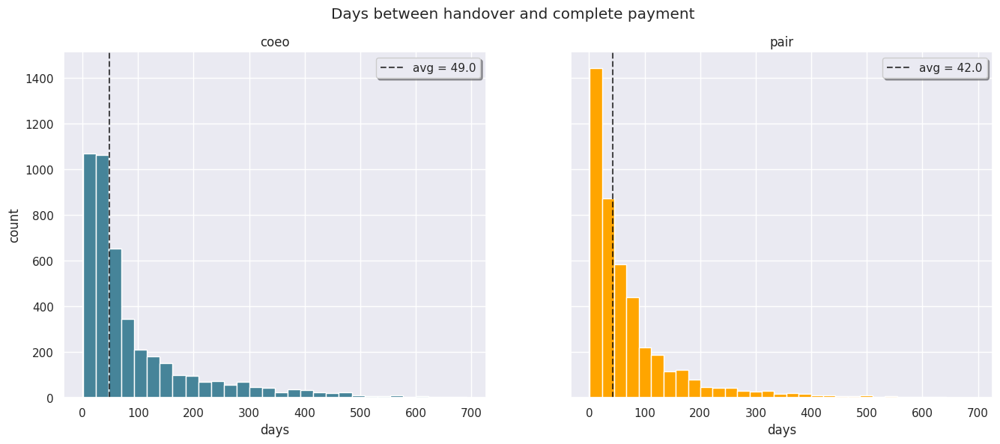

In [119]:
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True, figsize=(16, 6))
k = 0

for ag in sorted(list(set(all_data.agency))):
    mean = round(
        all_data[
            (all_data["amount"] == all_data["main_claim_payment_accumulated"])
            & (all_data.agency == ag)
        ]["days_diff"].median(),
        2,
    )
    hist = all_data[
        (all_data["amount"] == all_data["main_claim_payment_accumulated"])
        & (all_data.agency == ag)
    ]["days_diff"].hist(ax=ax[k], color=color_map.get(ag), bins=30)
    line = ax[k].axvline(x=mean, color="black", linestyle="--", alpha=0.7)
    ax[k].set_title(ag)
    ax[k].set_xlabel("days")
    ax[k].legend(
        (hist, line), ("days", f"avg = {mean}"), loc="upper right", shadow=True
    )
    k += 1

ax[0].set_ylabel("count")
fig.suptitle("Days between handover and complete payment")
plt.show()

## Cumulative Payments

In [121]:
cumulative_payments = (
    all_data[["agency", "payment_date", "main_claim_payment"]]
    .groupby(["agency", "payment_date"])
    .sum()
    .sort_values(by=["agency", "payment_date"])
    .groupby(["agency"])
    .cumsum()
    .reset_index()
)
cumulative_payments["payment_date"] = pd.to_datetime(
    cumulative_payments["payment_date"]
)

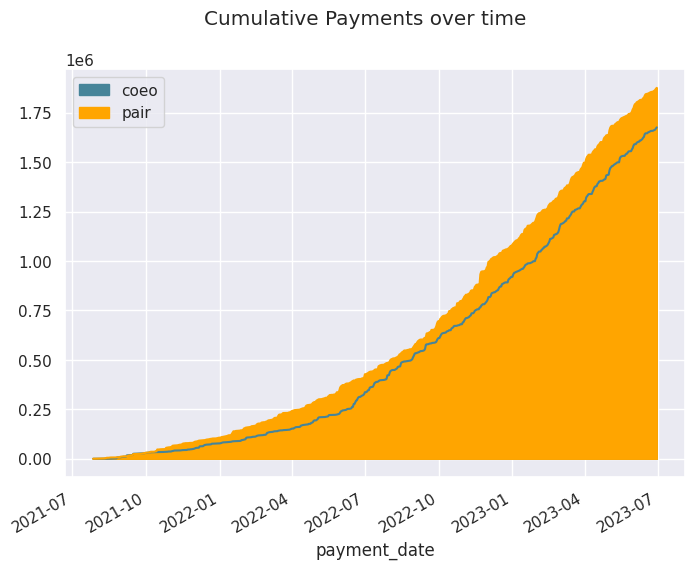

In [122]:
fig, ax = plt.subplots(nrows=1, ncols=1)


for ag in sorted(list(set(cumulative_payments.agency))):
    cumulative_payments[cumulative_payments.agency == ag].plot(
        kind="area",
        x="payment_date",
        y="main_claim_payment",
        ax=ax,
        label=ag,
        color=color_map.get(ag),
    )

fig.suptitle("Cumulative Payments over time")
plt.show()

In [123]:
cumulative_payments = pd.merge(
    cumulative_payments, handover_agg, on="agency", how="inner"
)

In [124]:
cumulative_payments["cumulative_recovery_rate"] = (
    cumulative_payments.main_claim_payment / cumulative_payments.amount
)

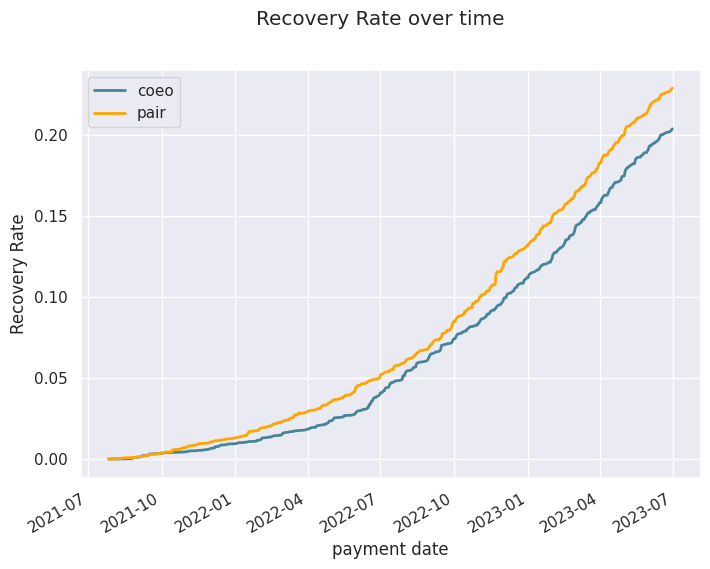

In [125]:
fig, ax = plt.subplots(nrows=1, ncols=1)

for ag in sorted(list(set(cumulative_payments.agency))):
    cumulative_payments[cumulative_payments.agency == ag].plot(
        ax=ax,
        x="payment_date",
        y="cumulative_recovery_rate",
        label=ag,
        color=color_map.get(ag),
        linewidth=2,
    )

ax.set_xlabel("payment date")
ax.set_ylabel("Recovery Rate")
fig.suptitle("Recovery Rate over time")
plt.show()

## Recovery Rates per Cohort

In [128]:
cohort_base_amts = (
    users[["agency", "amount", "created_date"]]
    .groupby(by=["created_date", "agency"])
    .sum()
)
cohort_recoveries = (
    all_data[["agency", "created_date", "main_claim_payment"]]
    .groupby(by=["created_date", "agency"])
    .sum()
)
cohort_recoveries = pd.merge(
    cohort_recoveries, cohort_base_amts, on=["created_date", "agency"], how="inner"
)

In [129]:
cohort_recoveries["recovery_rate"] = (
    cohort_recoveries["main_claim_payment"] / cohort_recoveries["amount"] * 100.0
)

## Cumulative Payments Per Cohort

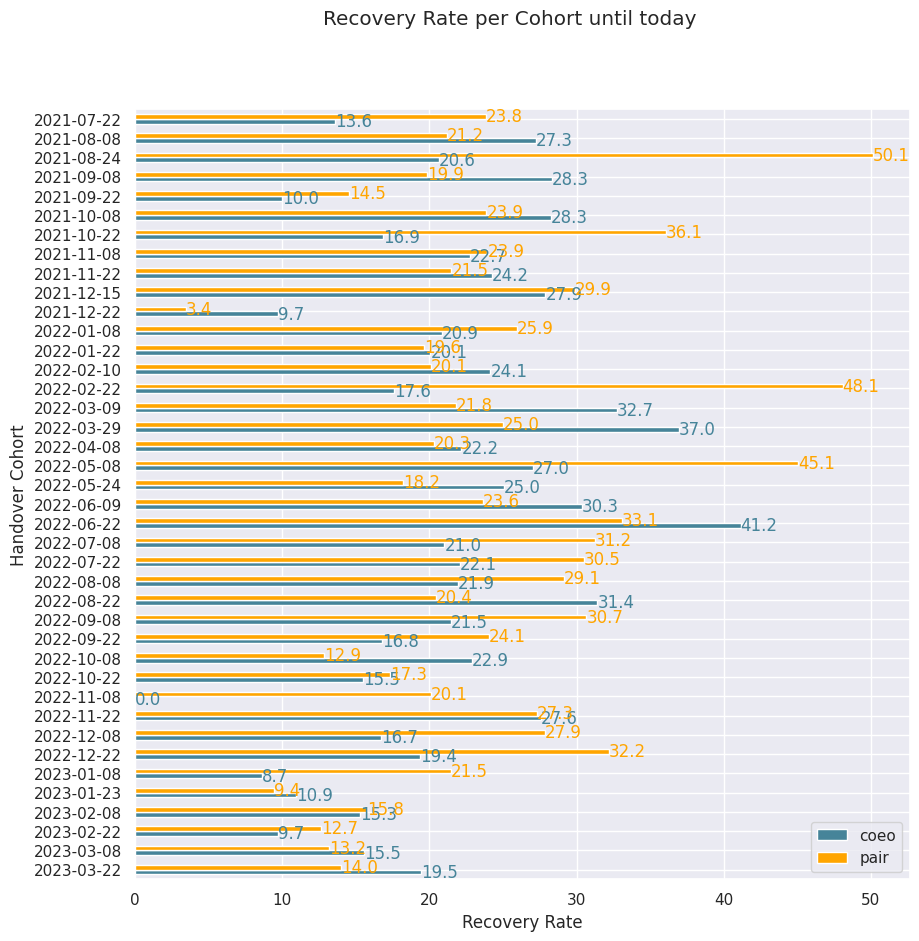

In [130]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
y = (
    cohort_recoveries[["recovery_rate"]]
    .unstack()
    .sort_values(by="created_date", ascending=False)
)
y.plot(kind="barh", ax=ax, color=color_tuple)
ax.set_xlabel("Recovery Rate")
ax.set_ylabel("Handover Cohort")
ax.legend(labels=("coeo", "pair"))


for k, container in enumerate(ax.containers):
    ax.bar_label(container, color=color_tuple[k], fmt="%.1f")
fig.suptitle("Recovery Rate per Cohort until today")
plt.show()

## Cumulative Payments Per Cohort

In [131]:
cumulative_payments_per_cohort = (
    all_data[["agency", "created_date", "payment_date", "main_claim_payment"]]
    .groupby(["agency", "created_date", "payment_date"])
    .sum()
    .sort_values(by=["agency", "created_date", "payment_date"])
    .groupby(["created_date", "agency"])
    .cumsum()
    .reset_index()
)

In [132]:
len(set(cumulative_payments_per_cohort.created_date))

40

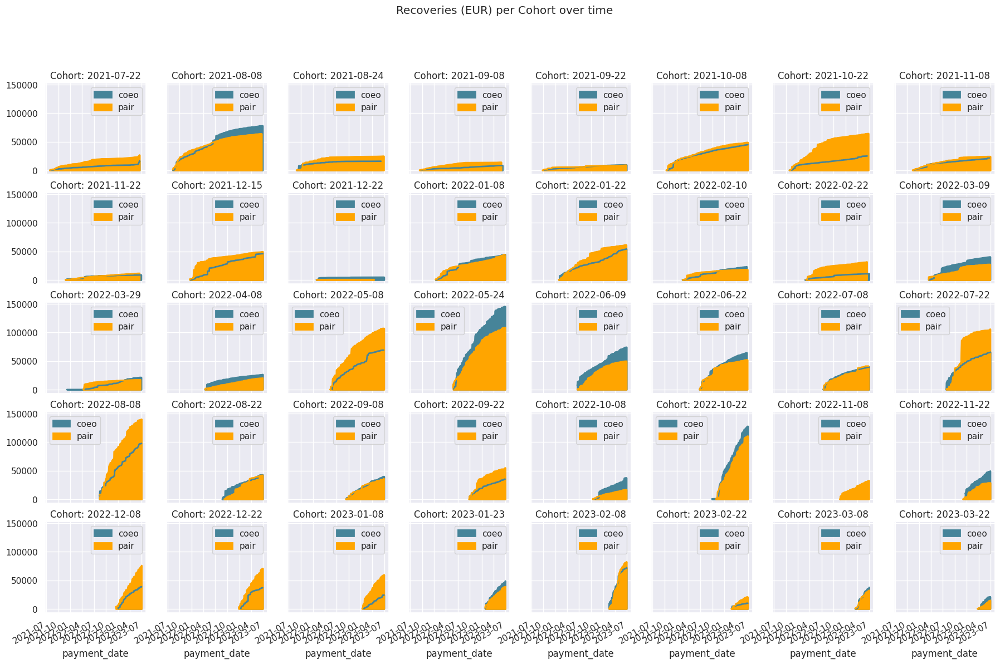

In [142]:
# 40 = 8 * 5

fig, ax = plt.subplots(nrows=5, ncols=8, sharex=True, sharey=True, figsize=(22, 14))

for i, k in enumerate(sorted(list(set(cumulative_payments_per_cohort.created_date)))):
    # we map 1d-array (created_dates) to 2d-array ax:
    row_index = int(i / 8)
    column_index = int(i % 8)
    ax[row_index][column_index].set_title(f"Cohort: {str(k)[:10]}")

    for ag in sorted(list(set(cumulative_payments.agency))):
        cumulative_payments_per_cohort[
            (cumulative_payments_per_cohort.created_date == k)
            & (cumulative_payments_per_cohort.agency == ag)
        ].plot(
            kind="area",
            ax=ax[row_index][column_index],
            x="payment_date",
            y="main_claim_payment",
            label=ag,
            color=color_map.get(ag),
            linewidth=2,
        )

# ax[3][5].axis('off')
# ax[3][6].axis('off')
fig.suptitle("Recoveries (EUR) per Cohort over time")
plt.show()

## Recovery Rates Per Cohort

In [134]:
handover_agg_per_cohort = (
    users[["amount", "agency", "created_date"]]
    .groupby(by=["created_date", "agency"])
    .sum()
    .reset_index()
)

In [135]:
cumulative_payments_per_cohort["created_date"] = cumulative_payments_per_cohort[
    "created_date"
].astype(str)
handover_agg_per_cohort["created_date"] = handover_agg_per_cohort[
    "created_date"
].astype(str)

In [136]:
cumulative_payments_per_cohort = pd.merge(
    cumulative_payments_per_cohort,
    handover_agg_per_cohort,
    on=["created_date", "agency"],
    how="right",
)
cumulative_payments_per_cohort["created_date"] = pd.to_datetime(
    cumulative_payments_per_cohort["created_date"]
)

In [138]:
cumulative_payments_per_cohort["recovery_rate"] = (
    cumulative_payments_per_cohort.main_claim_payment
    / cumulative_payments_per_cohort.amount
    * 100.0
)

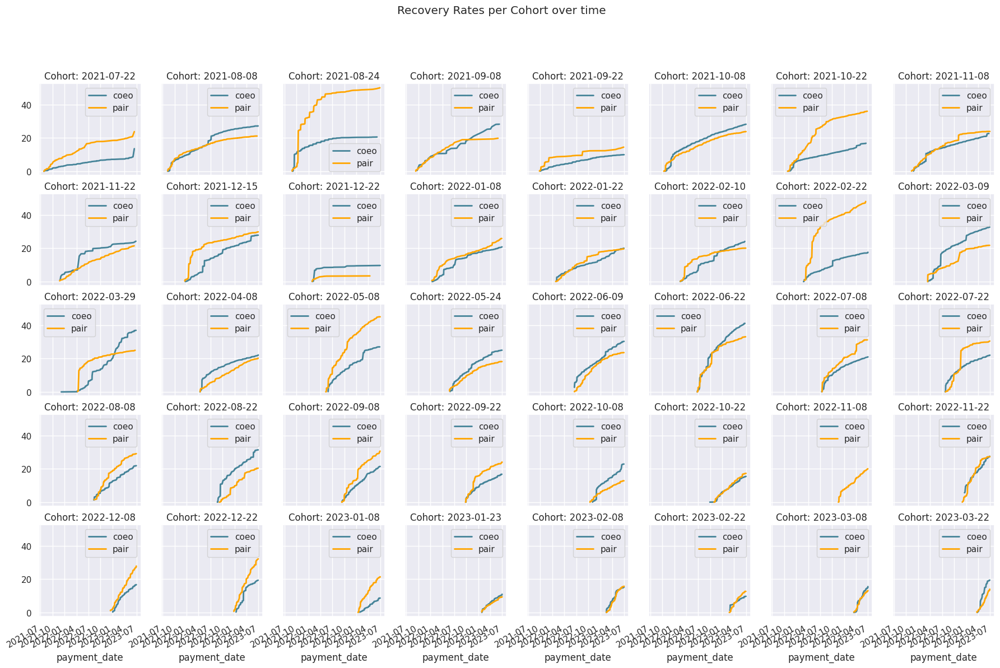

In [141]:
fig, ax = plt.subplots(nrows=5, ncols=8, sharex=True, sharey=True, figsize=(22, 14))

for i, k in enumerate(sorted(list(set(cumulative_payments_per_cohort.created_date)))):
    # we map 1d-array (created_dates) to 2d-array ax:
    row_index = int(i / 8)
    column_index = int(i % 8)
    ax[row_index][column_index].set_title(f"Cohort: {str(k)[:10]}")

    for ag in sorted(list(set(cumulative_payments.agency))):
        cumulative_payments_per_cohort[
            (cumulative_payments_per_cohort.created_date == k)
            & (cumulative_payments_per_cohort.agency == ag)
        ].plot(
            ax=ax[row_index][column_index],
            x="payment_date",
            y="recovery_rate",
            label=ag,
            color=color_map.get(ag),
            linewidth=2,
        )

# ax[3][5].axis('off')
# ax[3][6].axis('off')
fig.suptitle("Recovery Rates per Cohort over time")
plt.show()

## Recovered Cases per Cohort

In [143]:
cumulative_fully_recovered_cases_per_cohort = (
    fully_recovered[["agency", "created_date", "payment_date", "main_claim_payment"]]
    .groupby(["agency", "created_date", "payment_date"])
    .count()
    .sort_values(by=["agency", "created_date", "payment_date"])
    .groupby(["created_date", "agency"])
    .cumsum()
    .reset_index()
)

In [144]:
handover_cnt_per_cohort = (
    users[["amount", "agency", "created_date"]]
    .groupby(by=["created_date", "agency"])
    .count()
    .reset_index()
)

# for the join to work
cumulative_fully_recovered_cases_per_cohort[
    "created_date"
] = cumulative_fully_recovered_cases_per_cohort["created_date"].astype(str)
handover_cnt_per_cohort["created_date"] = handover_cnt_per_cohort[
    "created_date"
].astype(str)

In [145]:
cumulative_fully_recovered_cases_per_cohort = pd.merge(
    cumulative_fully_recovered_cases_per_cohort,
    handover_cnt_per_cohort,
    on=["created_date", "agency"],
    how="right",
)

cumulative_fully_recovered_cases_per_cohort["created_date"] = pd.to_datetime(
    cumulative_fully_recovered_cases_per_cohort["created_date"]
)

In [146]:
cumulative_fully_recovered_cases_per_cohort["share_recovered_cases"] = (
    cumulative_fully_recovered_cases_per_cohort.main_claim_payment
    / cumulative_fully_recovered_cases_per_cohort.amount
    * 100.0
)

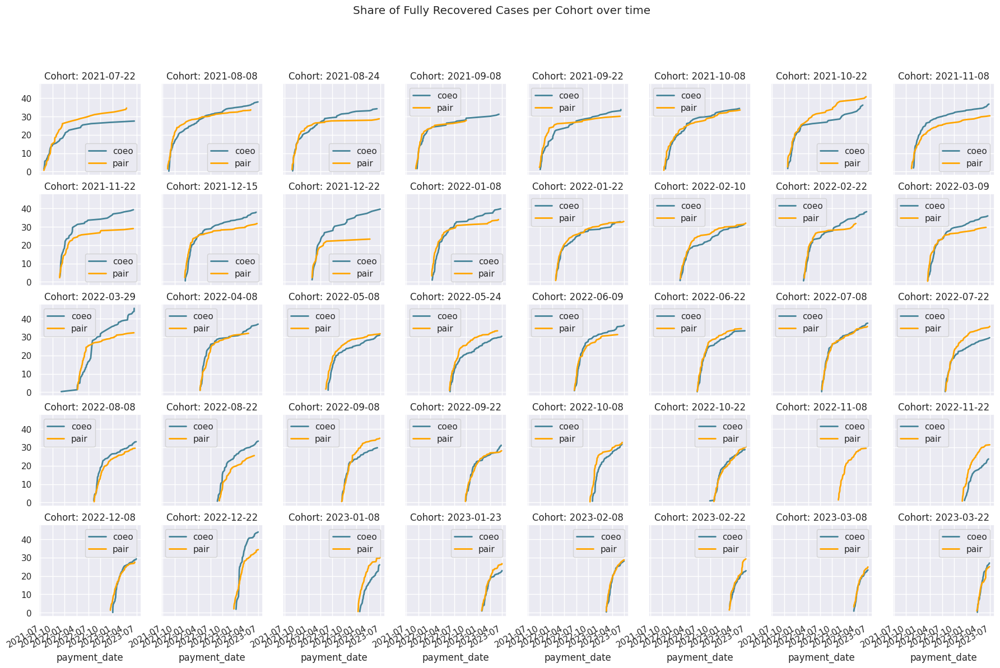

In [149]:
fig, ax = plt.subplots(nrows=5, ncols=8, sharex=True, sharey=True, figsize=(22, 14))

for i, k in enumerate(
    sorted(list(set(cumulative_fully_recovered_cases_per_cohort.created_date)))
):
    # we map 1d-array (created_dates) to 2d-array ax:
    row_index = int(i / 8)
    column_index = int(i % 8)
    ax[row_index][column_index].set_title(f"Cohort: {str(k)[:10]}")

    for ag in sorted(list(set(cumulative_payments.agency))):
        cumulative_fully_recovered_cases_per_cohort[
            (cumulative_fully_recovered_cases_per_cohort.created_date == k)
            & (cumulative_fully_recovered_cases_per_cohort.agency == ag)
        ].plot(
            ax=ax[row_index][column_index],
            x="payment_date",
            y="share_recovered_cases",
            label=ag,
            color=color_map.get(ag),
            linewidth=2,
        )

# ax[3][5].axis('off')
# ax[3][6].axis('off')
fig.suptitle("Share of Fully Recovered Cases per Cohort over time")
plt.show()

## Recovery Rate Per Bucket

In [156]:
rec_bucket = (
    all_data[["agency", "bucket", "main_claim_payment"]]
    .groupby(by=["agency", "bucket"])
    .sum()
    .reset_index()
)
handover_bucket = (
    users[["agency", "bucket", "amount"]]
    .groupby(by=["agency", "bucket"])
    .sum()
    .reset_index()
)

In [157]:
handover_bucket_cnt = (
    users[["agency", "bucket"]].groupby(by=["agency", "bucket"]).size().reset_index()
)

In [158]:
rec_bucket = pd.merge(rec_bucket, handover_bucket, on=["agency", "bucket"])

In [159]:
rec_bucket["recovery_rate"] = (
    rec_bucket["main_claim_payment"] / rec_bucket["amount"] * 100.0
)

In [160]:
rec_bucket = (
    rec_bucket[["agency", "bucket", "recovery_rate"]]
    .groupby(by=["agency", "bucket"])
    .mean()
)

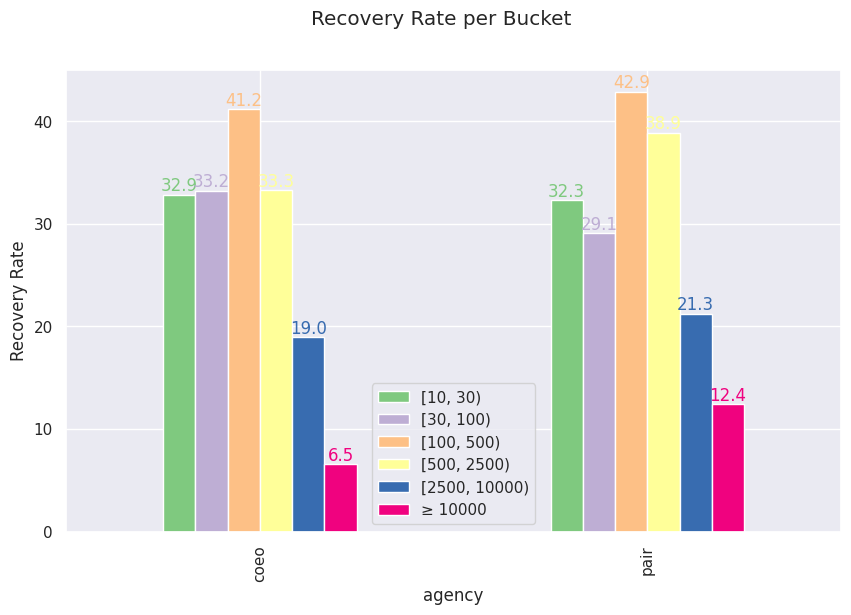

In [161]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
rec_bucket.unstack(-1).rename(columns=bucket_dict).plot(kind="bar", ax=ax, color=cols)

ax.set_ylabel("Recovery Rate")
for k, container in enumerate(ax.containers):
    ax.bar_label(container, color=cols[k], fmt="%.1f")
ax.legend(labels=buckets)
fig.suptitle("Recovery Rate per Bucket")
plt.show()

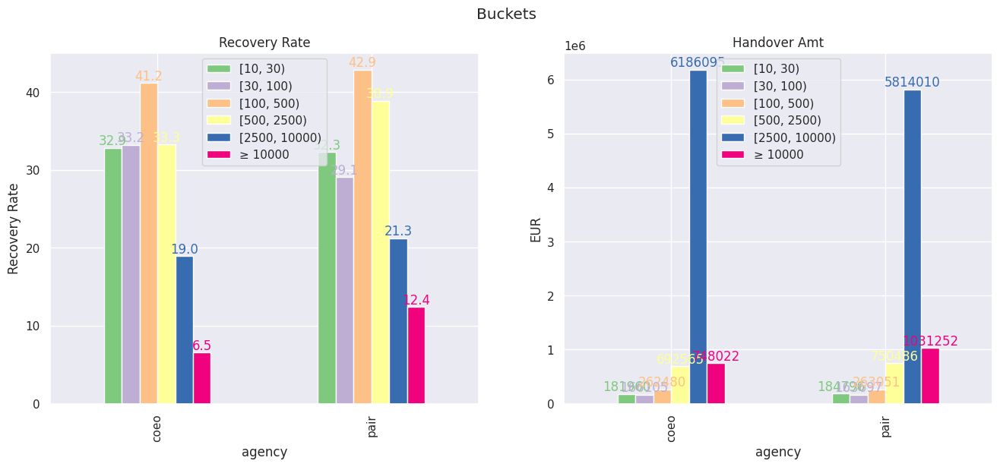

In [162]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

rec_bucket.unstack(-1).rename(columns=bucket_dict).plot(
    kind="bar", ax=ax[0], color=cols
)
handover_bucket.groupby(by=["agency", "bucket"]).mean().unstack(-1).plot(
    kind="bar", ax=ax[1], color=cols
)

ax[0].set_ylabel("Recovery Rate")
ax[1].set_ylabel("EUR")
ax[0].set_title("Recovery Rate")
ax[1].set_title("Handover Amt")
ax[0].legend(labels=buckets)
ax[1].legend(labels=buckets)

for k, container in enumerate(ax[0].containers):
    ax[0].bar_label(container, color=cols[k], fmt="%.1f")

for k, container in enumerate(ax[1].containers):
    ax[1].bar_label(container, color=cols[k], fmt="%.0f")

fig.suptitle("Buckets")
plt.show()

## OR WITH TOTAL HIST

In [165]:
aggregated_amt_tot = (
    users[["agency", "bucket", "amount"]]
    .groupby(by=["agency", "bucket"])
    .sum()
    .unstack(level=-1)
)
aggregated_amt_tot = aggregated_amt_tot.rename(columns=bucket_dict)

In [166]:
aggregated_amt_tot_plot = aggregated_amt_tot.sum().reset_index(level=0, drop=True)

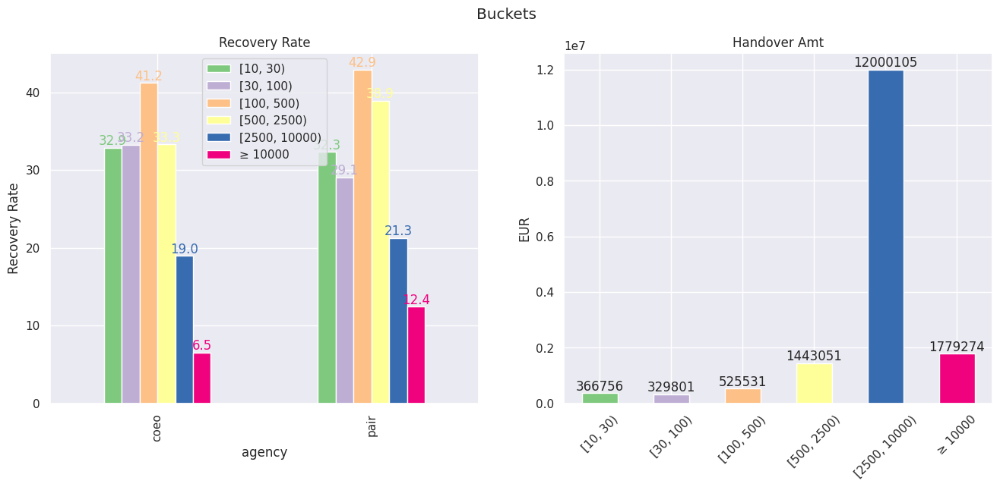

In [167]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

rec_bucket.unstack(-1).rename(columns=bucket_dict).plot(
    kind="bar", ax=ax[0], color=cols
)
aggregated_amt_tot_plot.plot(kind="bar", color=cols, ax=ax[1])

ax[0].set_ylabel("Recovery Rate")
ax[1].set_ylabel("EUR")
ax[1].set_xlabel("")
ax[0].set_title("Recovery Rate")
ax[1].set_title("Handover Amt")
ax[0].legend(labels=buckets)
# ax[1].legend(labels=buckets)

for k, container in enumerate(ax[0].containers):
    ax[0].bar_label(container, color=cols[k], fmt="%.1f")

for k, container in enumerate(ax[1].containers):
    ax[1].bar_label(container, fmt="%.0f")

ax[1].tick_params("x", labelrotation=45)

fig.suptitle("Buckets")
plt.show()

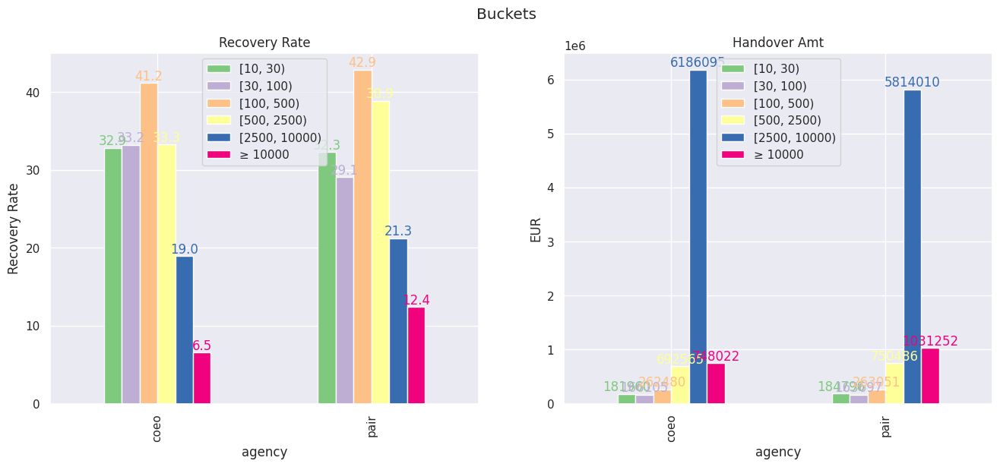

In [168]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

rec_bucket.unstack(-1).rename(columns=bucket_dict).plot(
    kind="bar", ax=ax[0], color=cols
)
handover_bucket.groupby(by=["agency", "bucket"]).mean().unstack(-1).plot(
    kind="bar", ax=ax[1], color=cols
)

ax[0].set_ylabel("Recovery Rate")
ax[1].set_ylabel("EUR")
ax[0].set_title("Recovery Rate")
ax[1].set_title("Handover Amt")
ax[0].legend(labels=buckets)
ax[1].legend(labels=buckets)

for k, container in enumerate(ax[0].containers):
    ax[0].bar_label(container, color=cols[k], fmt="%.1f")

for k, container in enumerate(ax[1].containers):
    ax[1].bar_label(container, color=cols[k], fmt="%.0f")

fig.suptitle("Buckets")
plt.show()

In [169]:
unstacked_1 = rec_bucket.reset_index().groupby(by=["bucket", "agency"]).mean().unstack()

In [170]:
unstacked_1["recovery_rate_delta"] = (
    unstacked_1[("recovery_rate", "pair")] - unstacked_1[("recovery_rate", "coeo")]
)
recovery_rate_delta_plot_1 = unstacked_1["recovery_rate_delta"]
recovery_rate_delta_plot_1 = pd.DataFrame(
    {
        key: [val]
        for key, val in zip(
            list(recovery_rate_delta_plot_1.index), list(recovery_rate_delta_plot_1)
        )
    }
)

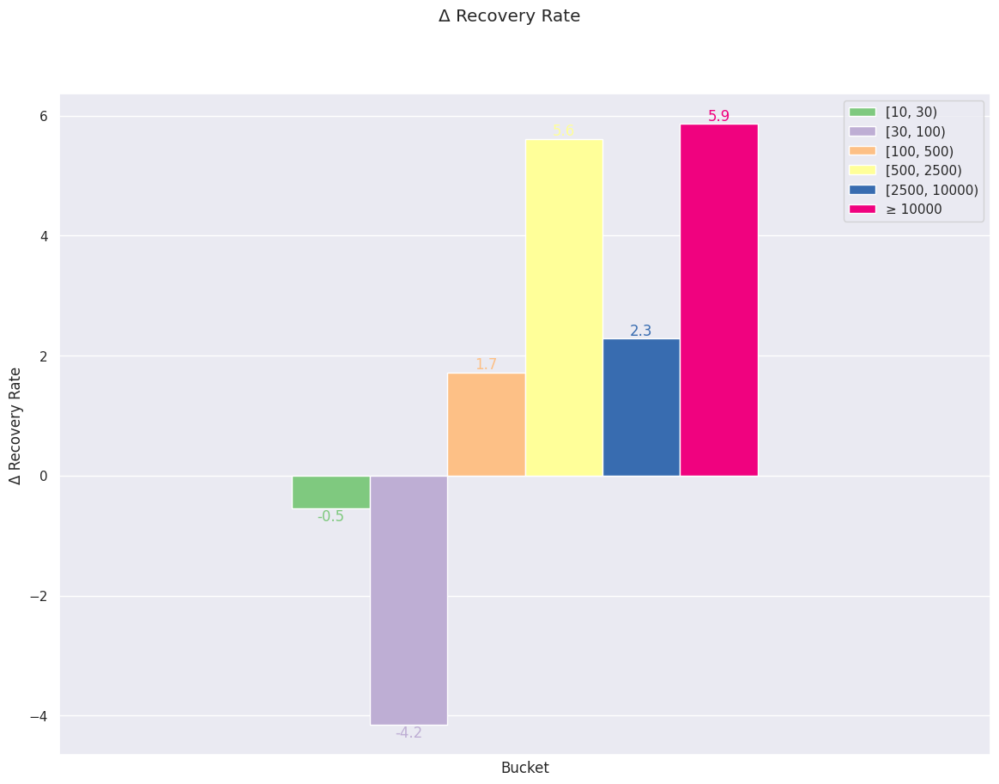

In [171]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14, 10))
recovery_rate_delta_plot_1.plot(kind="bar", ax=ax, color=cols)

ax.set_xlabel("Bucket")
ax.set_ylabel("Δ Recovery Rate")
ax.legend(labels=buckets)
ax.set_xticks([])

for k, container in enumerate(ax.containers):
    ax.bar_label(container, color=cols[k], fmt="%.1f")
fig.suptitle("Δ Recovery Rate")

plt.show()

In [173]:
# buckets

# drop left index
recovery_rate_delta_plot_better = recovery_rate_delta_plot_1.stack().droplevel(0)


# .index.map(bucket_dict)

In [174]:
delta_eur = pd.merge(
    aggregated_amt_tot_plot.rename("amount").reset_index(),
    recovery_rate_delta_plot_better.rename("delta_rr"),
    left_index=True,
    right_index=True,
)

In [175]:
delta_eur["eur_impact"] = delta_eur["amount"] * delta_eur["delta_rr"] / 100

In [176]:
delta_eur_plot = delta_eur.eur_impact
delta_eur_plot = delta_eur_plot.reset_index(drop=True)
delta_eur_plot = pd.DataFrame(
    {key: [val] for key, val in zip(list(delta_eur_plot.index), list(delta_eur_plot))}
)

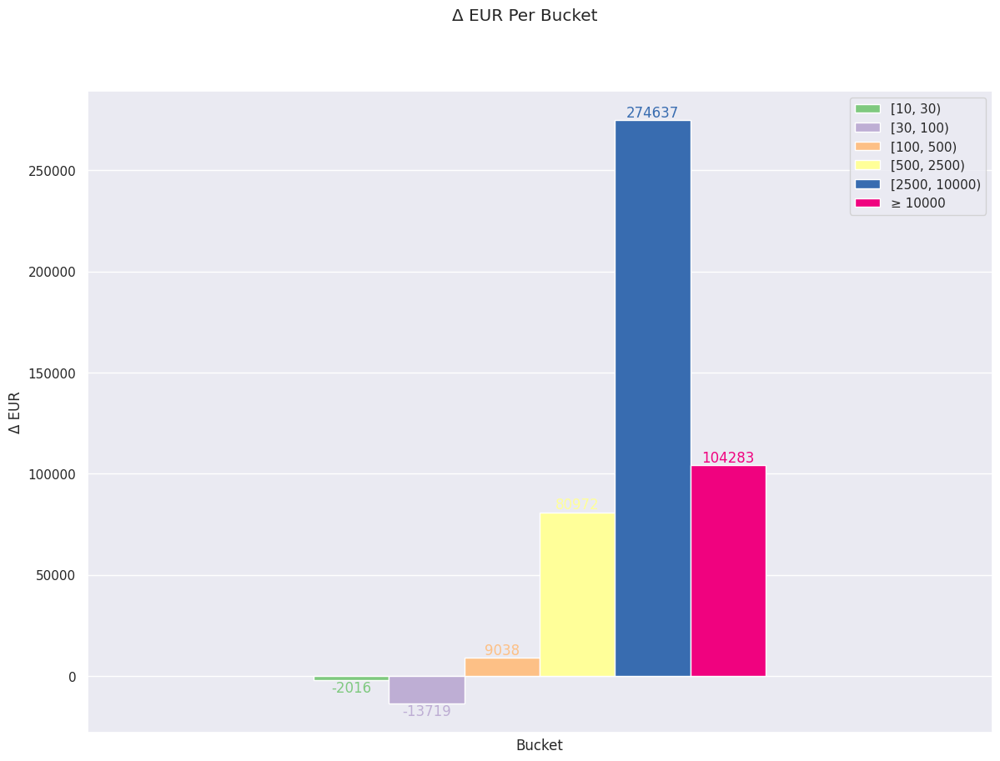

In [177]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14, 10))
delta_eur_plot.plot(kind="bar", ax=ax, color=cols)

ax.set_xlabel("Bucket")
ax.set_ylabel("Δ EUR")
ax.legend(labels=buckets)
ax.set_xticks([])

for k, container in enumerate(ax.containers):
    ax.bar_label(container, color=cols[k], fmt="%.0f")
fig.suptitle("Δ EUR Per Bucket")

plt.show()

In [178]:
# 180k
fully_recovered_deduped = fully_recovered.drop_duplicates(
    subset="claim_number", keep="first"
)

In [180]:
bla = (
    all_data[["agency", "bucket", "main_claim_payment"]]
    .groupby(["agency", "bucket"])
    .sum()
    .unstack(-1)
    .diff()
    .reset_index(drop=True)
    .iloc[1]
)

actual_diff = pd.DataFrame({key: [val] for key, val in zip(list(bla.index), list(bla))})

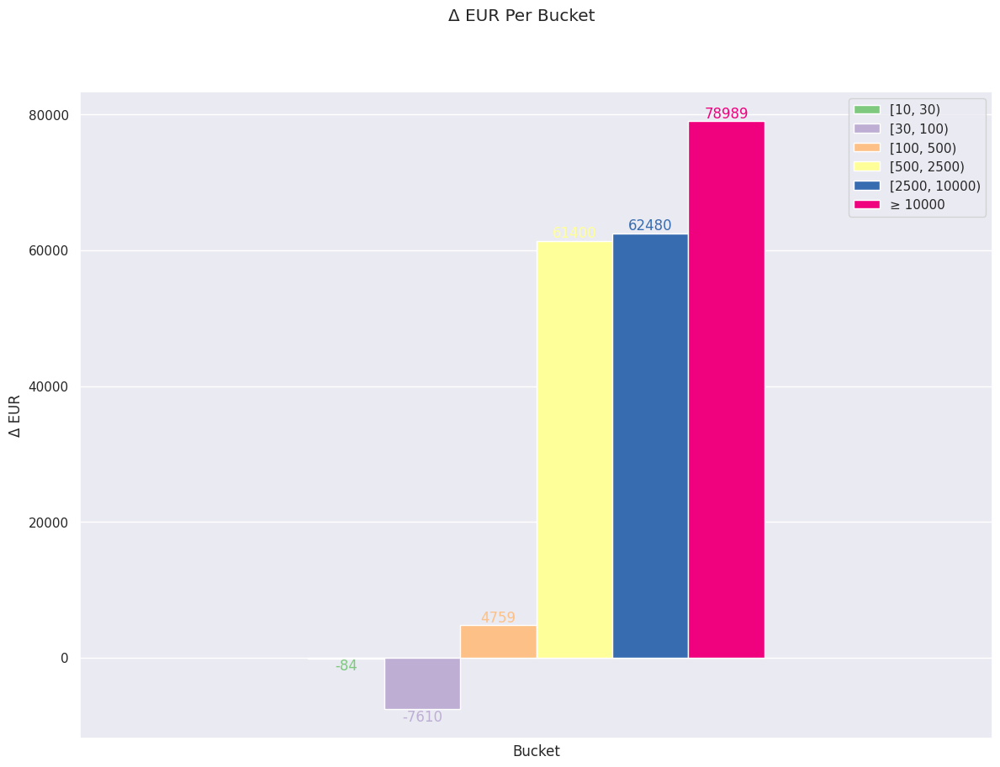

In [181]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14, 10))
actual_diff.plot(kind="bar", ax=ax, color=cols)

ax.set_xlabel("Bucket")
ax.set_ylabel("Δ EUR")
ax.legend(labels=buckets)
ax.set_xticks([])

for k, container in enumerate(ax.containers):
    ax.bar_label(container, color=cols[k], fmt="%.0f")
fig.suptitle("Δ EUR Per Bucket")

plt.show()

## RR debt type

In [182]:
rec_debt_type = (
    all_data[["agency", "debt_type_x", "main_claim_payment"]]
    .groupby(by=["agency", "debt_type_x"])
    .sum()
    .reset_index()
)
handover_debt_type = (
    users[["agency", "debt_type", "amount"]]
    .groupby(by=["agency", "debt_type"])
    .sum()
    .reset_index()
)
rec_debt_type = pd.merge(
    rec_debt_type,
    handover_debt_type,
    left_on=["agency", "debt_type_x"],
    right_on=["agency", "debt_type"],
)
rec_debt_type["recovery_rate"] = (
    rec_debt_type["main_claim_payment"] / rec_debt_type["amount"] * 100.0
)

rec_debt_type = (
    rec_debt_type[["agency", "debt_type_x", "recovery_rate"]]
    .groupby(by=["agency", "debt_type_x"])
    .mean()
)

In [183]:
rec_debt_type = rec_debt_type.rename({"debt_type_x": "debt_type"})

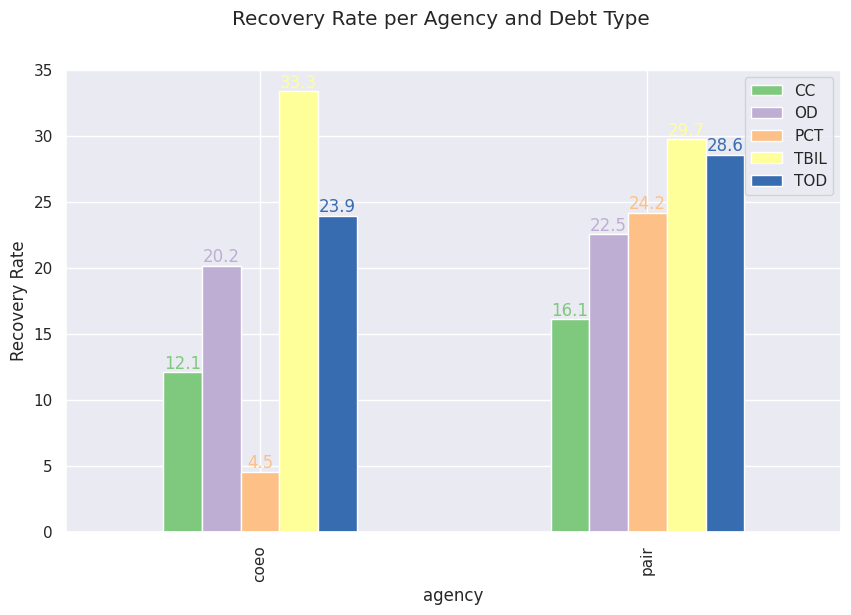

In [184]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
rec_debt_type.unstack(-1).plot(kind="bar", ax=ax, color=cols)

ax.set_ylabel("Recovery Rate")
for k, container in enumerate(ax.containers):
    ax.bar_label(container, color=cols[k], fmt="%.1f")
ax.legend(labels=sorted(list(set(handover_debt_type.debt_type))))
fig.suptitle("Recovery Rate per Agency and Debt Type")
plt.show()

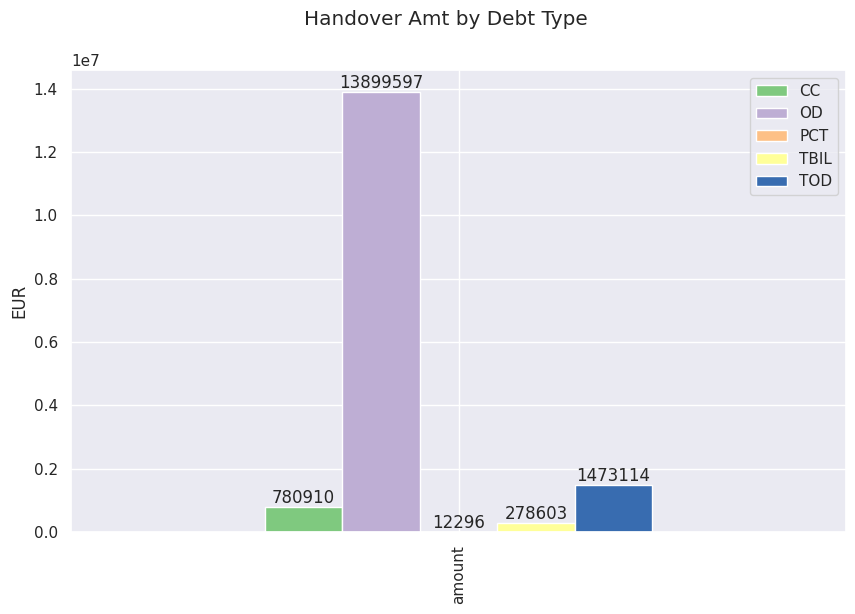

In [185]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
handover_debt_type[["agency", "debt_type", "amount"]].groupby(
    by=["agency", "debt_type"]
).mean().unstack(-1).sum().unstack(-1).plot(kind="bar", ax=ax, color=cols)

ax.set_ylabel("EUR")
for k, container in enumerate(ax.containers):
    ax.bar_label(container, fmt="%.0f")
ax.legend(labels=sorted(list(set(handover_debt_type.debt_type))))
fig.suptitle("Handover Amt by Debt Type")
plt.show()

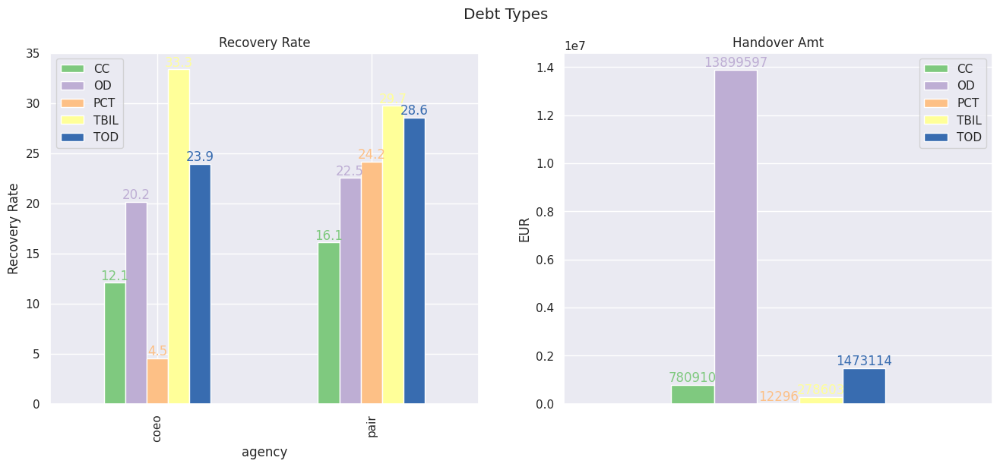

In [186]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

rec_debt_type.unstack(-1).plot(kind="bar", ax=ax[0], color=cols)
# handover_debt_type[['agency', 'debt_type', 'amount']].groupby(by=['agency', 'debt_type']).mean().unstack(-1).plot(kind='bar', ax=ax[1], color=cols)
handover_debt_type[["agency", "debt_type", "amount"]].groupby(
    by=["agency", "debt_type"]
).mean().unstack(-1).sum().unstack(-1).plot(kind="bar", ax=ax[1], color=cols)

ax[0].set_ylabel("Recovery Rate")
ax[1].set_ylabel("EUR")
ax[1].set_xticks([])
ax[0].set_title("Recovery Rate")
ax[1].set_title("Handover Amt")
ax[0].legend(labels=sorted(list(set(handover_debt_type.debt_type))))
ax[1].legend(labels=sorted(list(set(handover_debt_type.debt_type))))

for k, container in enumerate(ax[0].containers):
    ax[0].bar_label(container, color=cols[k], fmt="%.1f")

for k, container in enumerate(ax[1].containers):
    ax[1].bar_label(container, color=cols[k], fmt="%.0f")


fig.suptitle("Debt Types")
plt.show()

## CASES per bucket

In [187]:
fully_recovered_deduped_ = fully_recovered.drop_duplicates(
    subset="claim_number", keep="first"
)

In [188]:
case_bucket = (
    fully_recovered_deduped_[["agency", "bucket", "payment_date"]]
    .groupby(by=["agency", "bucket"])
    .size()
    .to_frame("recovered_cases")
)
handover_case_bucket = (
    users[["agency", "bucket"]]
    .groupby(by=["agency", "bucket"])
    .agg(count=("bucket", "count"))
    .reset_index()
)

In [189]:
case_bucket = pd.merge(
    case_bucket, handover_case_bucket, how="inner", on=["agency", "bucket"]
)

In [190]:
case_bucket["share_recovered_cases"] = (
    case_bucket["recovered_cases"] / case_bucket["count"] * 100.0
)

In [191]:
case_bucket = (
    case_bucket[["agency", "bucket", "share_recovered_cases"]]
    .groupby(by=["agency", "bucket"])
    .mean()
)

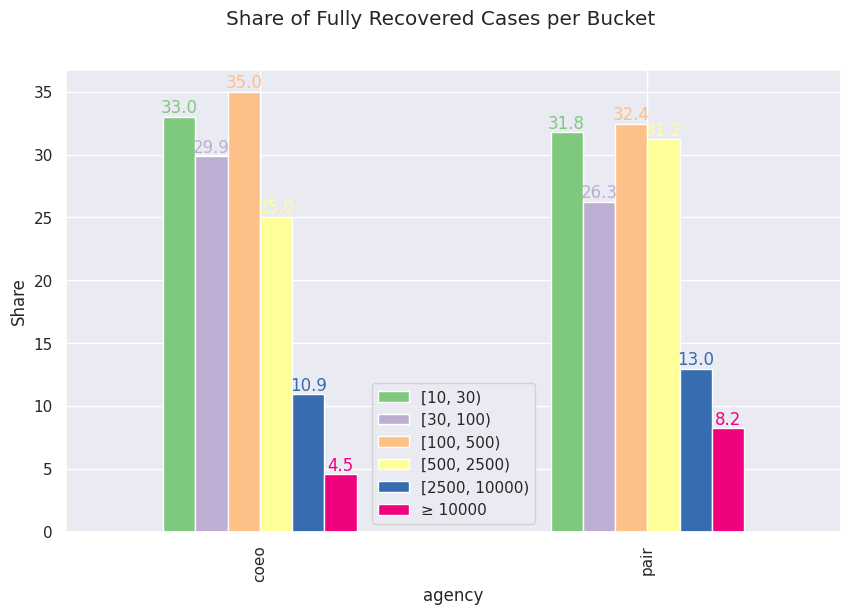

In [192]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
case_bucket.unstack(-1).rename(columns=bucket_dict).plot(kind="bar", ax=ax, color=cols)

ax.set_ylabel("Share")
for k, container in enumerate(ax.containers):
    ax.bar_label(container, color=cols[k], fmt="%.1f")
ax.legend(labels=buckets)
fig.suptitle("Share of Fully Recovered Cases per Bucket")
plt.show()

## Speed of Action per Bucket

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Legend does not support <AxesSubplot:title={'center':'Bucket 0, coeo'}> instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  del sys.path[0]
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Legend does not support <AxesSubplot:title={'center':'Bucket 0, pair'}> instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  del sys.path[0]
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Legend does not support <AxesSubplot:title={'center':'Bucket 1, coeo'}> instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artist

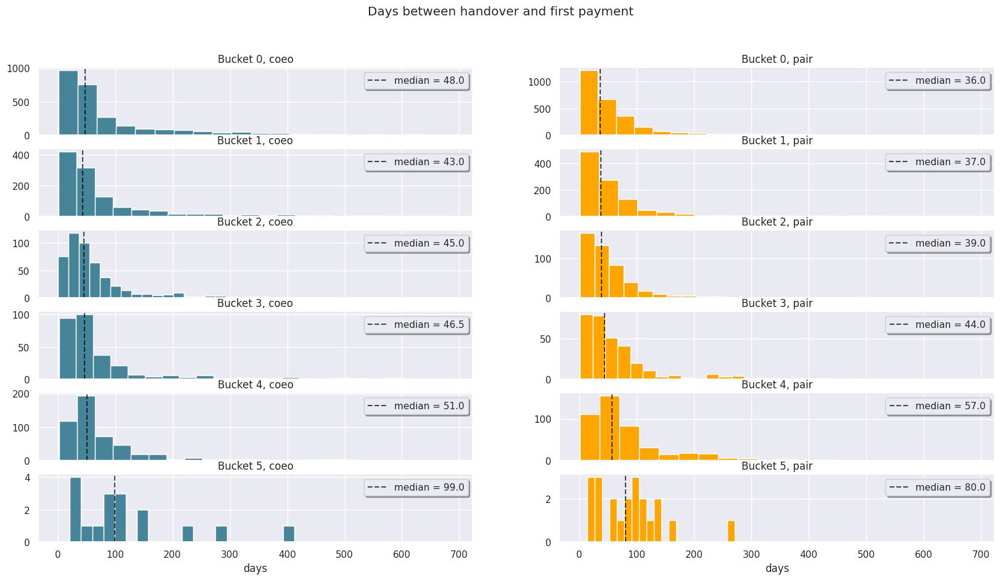

In [193]:
first_payment2 = (
    all_data[["agency", "user_id", "days_diff", "amount", "debt_type_y", "bucket"]]
    .groupby(by=["agency", "user_id", "amount", "debt_type_y", "bucket"])
    .min()
    .reset_index()
)
fig, ax = plt.subplots(nrows=6, ncols=2, sharex=True, sharey=False, figsize=(20, 10))

j = 0
k = 0

for j, bu in enumerate(sorted(list(set(first_payment2.bucket)))):
    for k, ag in enumerate(sorted(list(set(first_payment2.agency)))):
        median = round(
            first_payment2[
                (first_payment2.agency == ag) & (first_payment2.bucket == bu)
            ]["days_diff"].median(),
            2,
        )
        hist = first_payment2[
            (first_payment2.agency == ag) & (first_payment2.bucket == bu)
        ]["days_diff"].hist(
            ax=ax[j][k], color=color_map.get(ag), bins=20, density=False
        )
        line = ax[j][k].axvline(x=median, color="black", linestyle="--", alpha=0.7)
        ax[j][k].set_title(f"Bucket {bu}, {ag}")
        ax[j][k].legend(
            (hist, line), ("days", f"median = {median}"), loc="upper right", shadow=True
        )


ax[5][0].set_xlabel("days")
ax[5][1].set_xlabel("days")
# ax[0].set_ylabel('count')
fig.suptitle("Days between handover and first payment")
plt.show()

# Actual Cohorts with diff (payment_date, handover_date)

## Months

In [202]:
def get_color_dict_from_dates_and_colormap(dates, colormap="tab20c"):
    """Returns a dictionary of length len_dates mapping dates to colours passing through list of colours u of same length."""

    # make sure dates are unique
    dates = list(set(dates))

    len_dates = len(dates)

    cmap = mpl.cm.get_cmap(colormap)

    colors = [cmap(k)[:3] for k in range(len_dates)]

    return {date: color for date, color in zip(sorted(dates), colors)}


def get_list_of_colors_from_cmap(n, colormap="tab20c"):
    cmap = mpl.cm.get_cmap(colormap)

    colors = [cmap(k)[:3] for k in range(n)]

    return colors


def get_list_of_colors_from_cmap(n, colormap="tab20c"):
    cmap = mpl.cm.get_cmap(colormap)

    colors = [cmap(k)[:3] for k in range(n)]

    return colors

In [196]:
all_data["months_diff"] = (all_data["days_diff"] / 30).apply(np.floor)

In [197]:
all_data["month"] = all_data["created_date"].astype(str).str[:7]
users["month"] = users["created_date"].astype(str).str[:7]

In [198]:
cumulative_payments_monthly = (
    all_data[["agency", "month", "months_diff", "main_claim_payment"]]
    .groupby(["agency", "month", "months_diff"])
    .sum()
    .sort_values(by=["agency", "months_diff"])
    .groupby(["agency", "month"])
    .cumsum()
    .reset_index()
)
handover_agg_monthly = (
    users[["amount", "agency", "month"]]
    .groupby(by=["month", "agency"])
    .sum()
    .reset_index()
)

In [199]:
cumulative_payments_monthly = pd.merge(
    cumulative_payments_monthly,
    handover_agg_monthly,
    on=["month", "agency"],
    how="inner",
)

In [200]:
cumulative_payments_monthly["recovery_rate"] = (
    cumulative_payments_monthly["main_claim_payment"]
    / cumulative_payments_monthly["amount"]
    * 100.0
)

In [206]:
# colors
colors_tab20c_month = get_color_dict_from_dates_and_colormap(
    cumulative_payments_monthly.month
)

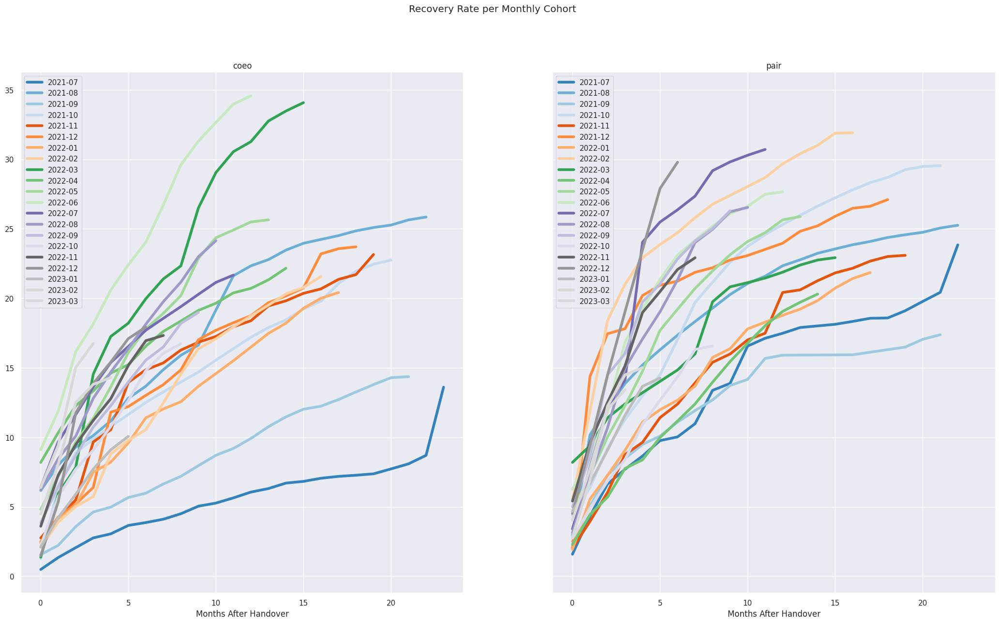

In [205]:
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True, figsize=(26, 14))

# color=tuple(np.array(color_map_month.get(mo))/255)
for i, ag in enumerate(sorted(set(cumulative_payments_monthly.agency))):
    for mo in sorted(list(set(cumulative_payments_monthly.month))):
        cumulative_payments_monthly[
            (cumulative_payments_monthly.month == mo)
            & (cumulative_payments_monthly.agency == ag)
        ].plot(
            ax=ax[i],
            x="months_diff",
            y="recovery_rate",
            label=mo,
            color=colors_tab20c_month.get(mo),
            linewidth=4,
        )
        ax[i].set_title(ag)
        ax[i].set_xlabel("Months After Handover")
        # integers on x-axis :)
        ax[i].xaxis.get_major_locator().set_params(integer=True)
fig.suptitle("Recovery Rate per Monthly Cohort")
plt.show()

## Quarters

In [208]:
all_data["quarter"] = pd.PeriodIndex(all_data["created_date"], freq="Q")
users["quarter"] = pd.PeriodIndex(users["created_date"], freq="Q")

all_data["quarters_diff"] = (all_data["days_diff"] / 91).apply(np.floor)

cumulative_payments_quarterly = (
    all_data[["agency", "quarter", "quarters_diff", "main_claim_payment"]]
    .groupby(["agency", "quarter", "quarters_diff"])
    .sum()
    .sort_values(by=["agency", "quarters_diff"])
    .groupby(["agency", "quarter"])
    .cumsum()
    .reset_index()
)
handover_agg_quarterly = (
    users[["amount", "agency", "quarter"]]
    .groupby(by=["quarter", "agency"])
    .sum()
    .reset_index()
)

In [209]:
cumulative_payments_quarterly = pd.merge(
    cumulative_payments_quarterly,
    handover_agg_quarterly,
    on=["quarter", "agency"],
    how="inner",
)

In [210]:
cumulative_payments_quarterly["recovery_rate"] = (
    cumulative_payments_quarterly["main_claim_payment"]
    / cumulative_payments_quarterly["amount"]
    * 100
)

In [211]:
colors_tab10_quarter = get_color_dict_from_dates_and_colormap(
    cumulative_payments_quarterly.quarter, colormap="Set2"
)

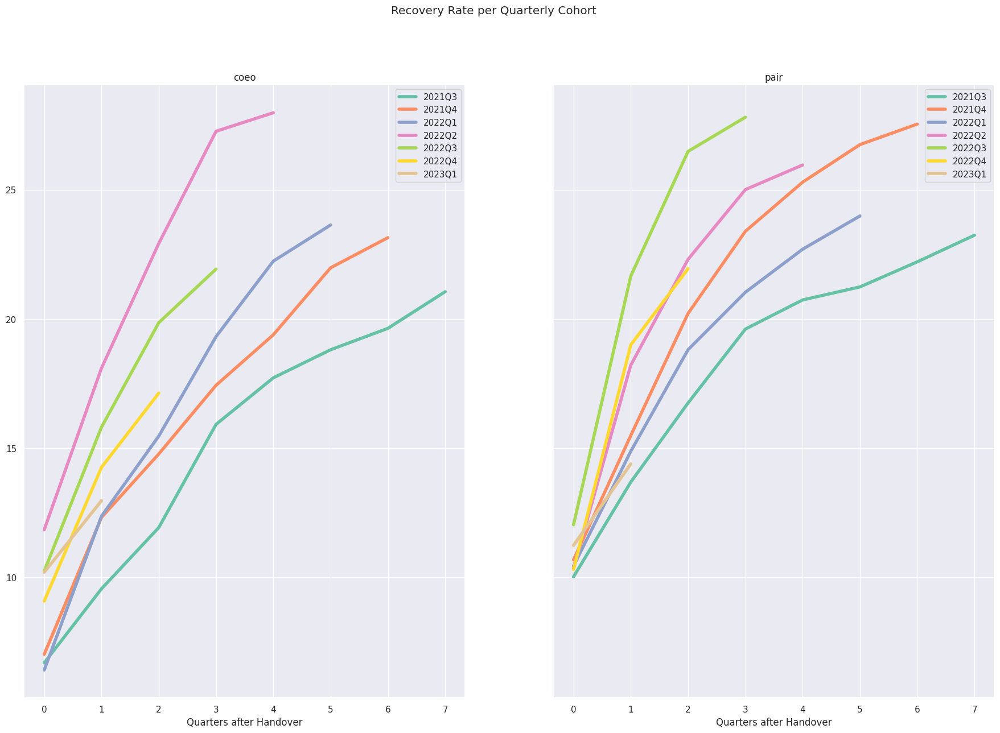

In [212]:
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True, figsize=(22, 14))

for i, ag in enumerate(sorted(set(cumulative_payments_quarterly.agency))):
    for qu in sorted(list(set(cumulative_payments_quarterly.quarter))):
        cumulative_payments_quarterly[
            (cumulative_payments_quarterly.quarter == qu)
            & (cumulative_payments_quarterly.agency == ag)
        ].plot(
            ax=ax[i],
            x="quarters_diff",
            y="recovery_rate",
            label=qu,
            color=colors_tab10_quarter.get(qu),
            linewidth=4,
        )
        ax[i].set_title(ag)
        ax[i].set_xlabel("Quarters after Handover")

fig.suptitle("Recovery Rate per Quarterly Cohort")
plt.show()

In [215]:
rr_quarterly = (
    cumulative_payments_quarterly[["quarter", "agency", "main_claim_payment", "amount"]]
    .groupby(by=["quarter", "agency"])
    .max()
    .reset_index()
)

rr_quarterly["recovery_rate"] = (
    rr_quarterly["main_claim_payment"] / rr_quarterly["amount"] * 100
)

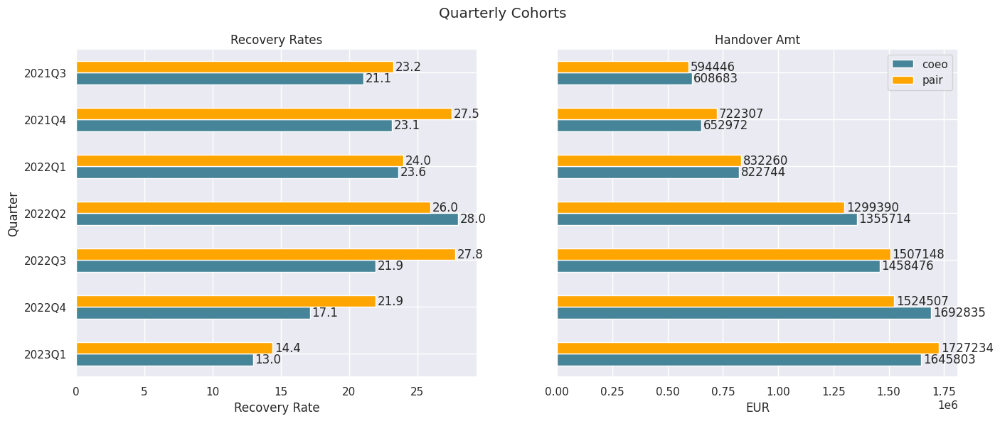

In [214]:
rr_quarterly_plot = rr_quarterly[["quarter", "agency", "recovery_rate"]]
amt_quarterly_plot = rr_quarterly[["quarter", "agency", "amount"]]

fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(16, 6))

rr_quarterly_plot.groupby(by=["quarter", "agency"]).mean().unstack().sort_values(
    by="quarter", ascending=False
).plot(kind="barh", ax=ax[0], color=tuple(color_map.values()))
amt_quarterly_plot.groupby(by=["quarter", "agency"]).mean().unstack().sort_values(
    by="quarter", ascending=False
).plot(kind="barh", ax=ax[1], color=tuple(color_map.values()))

ax[0].set_xlabel("Recovery Rate")
ax[0].set_ylabel("Quarter")
# ax[0].legend(labels=('coeo', 'pair'))
ax[0].get_legend().remove()
ax[0].set_title("Recovery Rates")

ax[1].set_xlabel("EUR")
ax[1].set_ylabel("Quarter")
ax[1].legend(labels=("coeo", "pair"))
ax[1].set_title("Handover Amt")

for container in ax[0].containers:
    ax[0].bar_label(container, fmt="%.1f", padding=2)

for container in ax[1].containers:
    ax[1].bar_label(container, fmt="%0.0f", padding=2)

fig.suptitle("Quarterly Cohorts")

plt.show()

## Qarterly Cohorts and Buckets

In [216]:
cumulative_payments_quarterly_buckets = (
    all_data[["agency", "quarter", "quarters_diff", "main_claim_payment", "bucket"]]
    .groupby(["agency", "quarter", "quarters_diff", "bucket"])
    .sum()
    .sort_values(by=["agency", "bucket", "quarters_diff"])
    .groupby(["agency", "quarter", "bucket"])
    .cumsum()
    .reset_index()
)
handover_agg_quarterly_buckets = (
    users[["amount", "agency", "quarter", "bucket"]]
    .groupby(by=["quarter", "agency", "bucket"])
    .sum()
    .reset_index()
)

In [217]:
cumulative_payments_quarterly_buckets = pd.merge(
    cumulative_payments_quarterly_buckets,
    handover_agg_quarterly_buckets,
    on=["quarter", "agency", "bucket"],
    how="inner",
)

In [218]:
# this takes the highest quarters_diff ("today's" value)
rr_quarterly_buckets = (
    cumulative_payments_quarterly_buckets[
        ["quarter", "agency", "bucket", "main_claim_payment", "amount"]
    ]
    .groupby(by=["quarter", "agency", "bucket"])
    .max()
    .reset_index()
)

rr_quarterly_buckets["recovery_rate"] = (
    rr_quarterly_buckets["main_claim_payment"] / rr_quarterly_buckets["amount"] * 100.0
)

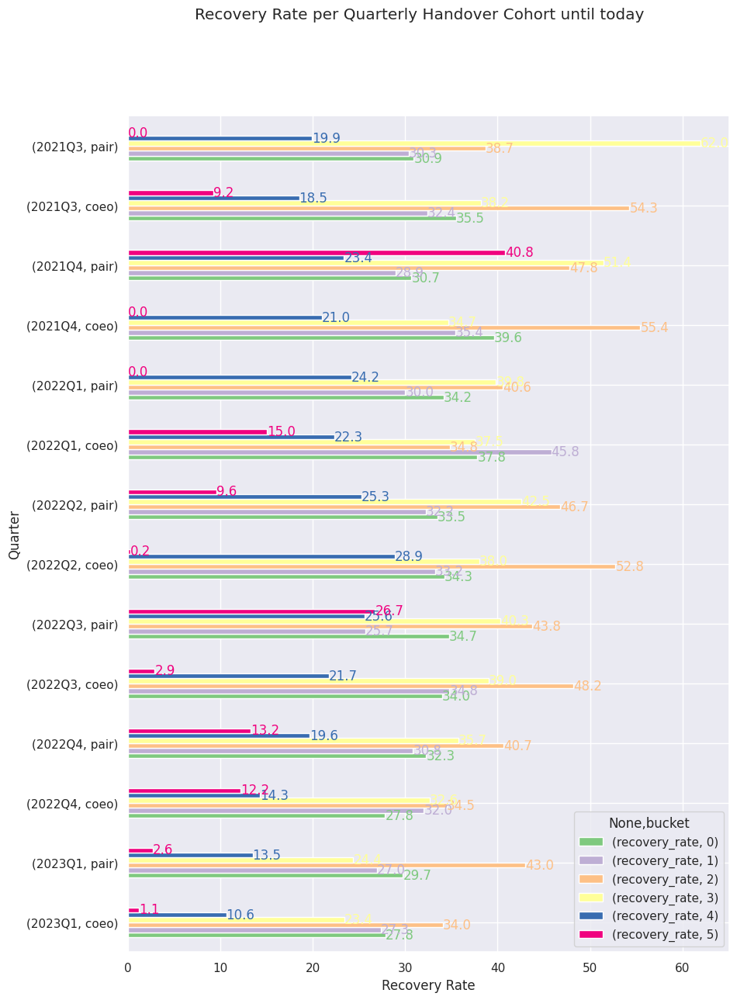

In [219]:
rr_quarterly_buckets_plot = rr_quarterly_buckets[
    ["quarter", "agency", "bucket", "recovery_rate"]
]

# ,color=tuple(color_map.values())
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 14))
rr_quarterly_buckets_plot.groupby(
    by=["quarter", "agency", "bucket"]
).mean().unstack().sort_values(by="quarter", ascending=False).plot(
    kind="barh", ax=ax, color=cols
)

ax.set_xlabel("Recovery Rate")
ax.set_ylabel("Quarter")
# ax.legend(labels=('coeo', 'pair'))

for k, container in enumerate(ax.containers):
    ax.bar_label(container, color=cols[k], fmt="%.1f")
fig.suptitle("Recovery Rate per Quarterly Handover Cohort until today")

plt.show()

## Overall population [Should be in section 1]

In [220]:
users_cnt_bucket = (
    users[["agency", "bucket", "amount"]]
    .groupby(by=["agency", "bucket"])
    .size()
    .unstack(level=-1)
)
users_cnt_bucket = users_cnt_bucket.rename(columns=bucket_dict)
users_cnt_bucket = users_cnt_bucket.sum()

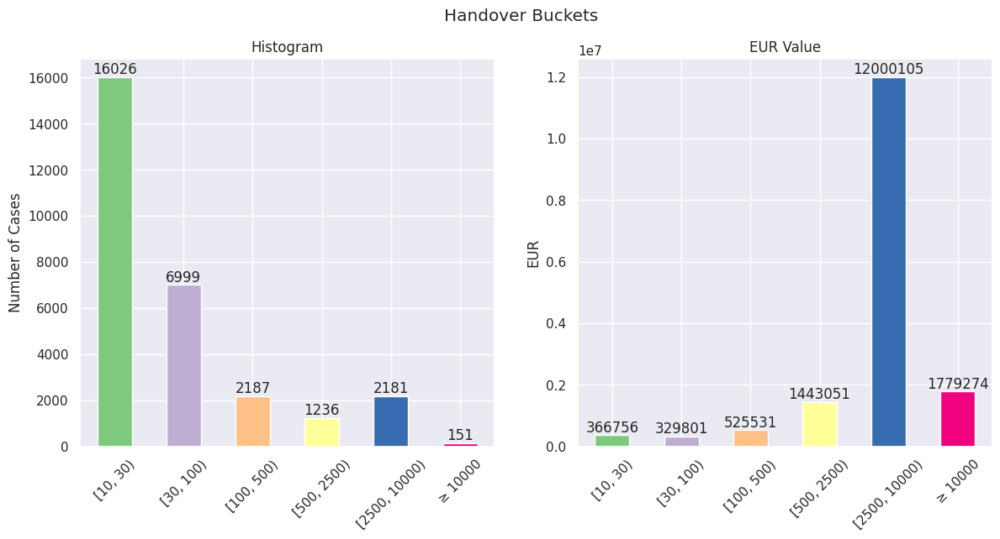

In [221]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

users_cnt_bucket.plot(kind="bar", color=cols, ax=ax[0])
aggregated_amt_tot_plot.plot(kind="bar", color=cols, ax=ax[1])


for container in ax[0].containers:
    ax[0].bar_label(container, fmt="%.0f")

for container in ax[1].containers:
    ax[1].bar_label(container, fmt="%.0f")


ax[0].set_xlabel("")
ax[1].set_xlabel("")
ax[0].set_ylabel("Number of Cases")
ax[1].set_ylabel("EUR")

ax[0].set_title("Histogram")
ax[1].set_title("EUR Value")

ax[0].tick_params("x", labelrotation=45)
ax[1].tick_params("x", labelrotation=45)

fig.suptitle("Handover Buckets")
plt.show()

In [225]:
users_cnt_debt = (
    users[["agency", "debt_type", "amount"]]
    .groupby(by=["agency", "debt_type"])
    .size()
    .unstack(level=-1)
)
users_cnt_debt = users_cnt_debt.sum()

aggregated_amt_debt = (
    users[["agency", "debt_type", "amount"]]
    .groupby(by=["agency", "debt_type"])
    .sum()
    .unstack(level=-1)
)

In [223]:
aggregated_amt_debt_plot = aggregated_amt_debt.sum().reset_index(level=0, drop=True)

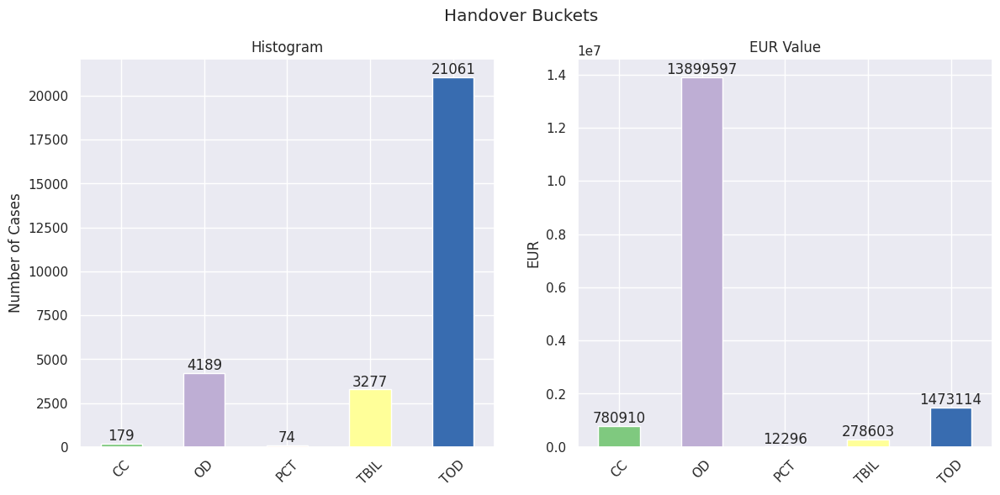

In [226]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

users_cnt_debt.plot(kind="bar", color=cols, ax=ax[0])
aggregated_amt_debt_plot.plot(kind="bar", color=cols, ax=ax[1])


for container in ax[0].containers:
    ax[0].bar_label(container, fmt="%.0f")

for container in ax[1].containers:
    ax[1].bar_label(container, fmt="%.0f")


ax[0].set_xlabel("")
ax[1].set_xlabel("")
ax[0].set_ylabel("Number of Cases")
ax[1].set_ylabel("EUR")

ax[0].set_title("Histogram")
ax[1].set_title("EUR Value")

ax[0].tick_params("x", labelrotation=45)
ax[1].tick_params("x", labelrotation=45)

fig.suptitle("Handover Buckets")
plt.show()

# Forecast

In [230]:
from scipy.optimize import curve_fit


def expon(x, a, b, c):
    return a * np.exp(-b * x) + c

In [236]:
cond = (cumulative_payments_quarterly["agency"] == ag) & (
    cumulative_payments_quarterly["quarter"] == qu
)

y = list(cumulative_payments_quarterly[cond]["recovery_rate"])

y

[11.23400008903253, 14.38829449050335]

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in exp
  after removing the cwd from sys.path.


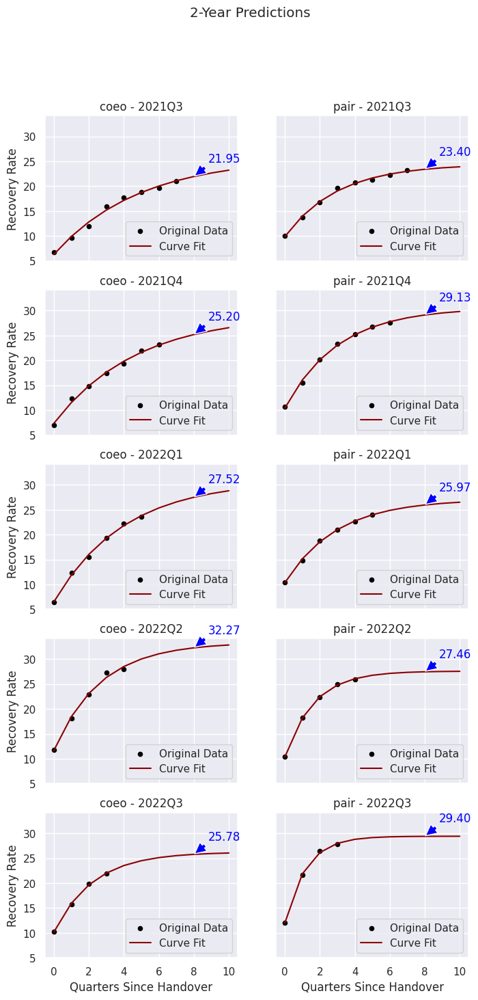

In [237]:
n = 10
x2 = np.linspace(0, n, n + 1)

pred_2y = []
agency_list = []
params = []


fig, ax = plt.subplots(nrows=5, ncols=2, sharex=True, sharey=True, figsize=(8, 16))

for i, ag in enumerate(sorted(list(set(cumulative_payments_quarterly.agency)))):
    for k, qu in enumerate(sorted(list(set(cumulative_payments_quarterly.quarter)))):
        cond = (cumulative_payments_quarterly["agency"] == ag) & (
            cumulative_payments_quarterly["quarter"] == qu
        )

        y = list(cumulative_payments_quarterly[cond]["recovery_rate"])

        if len(y) < 4:
            pass

        else:
            x = np.linspace(0, len(y) - 1, len(y))

            if ag == "coeo" and str(qu) == "2021Q3":
                popt, pcov = curve_fit(expon, x, y)
                # , sigma=[1,1,20,1,1,1]

            else:
                popt, pcov = curve_fit(expon, x, y)

            pred_y = expon(x2, *popt)

            orig = pd.DataFrame({"Quarters Since Handover": x, "Recovery Rate": y})
            pred = pd.DataFrame({"Quarters Since Handover": x2, "Curve Fit": pred_y})

            # plt.figure()

            orig.plot(
                x="Quarters Since Handover",
                y="Recovery Rate",
                kind="scatter",
                label="Original Data",
                color="black",
                ax=ax[k][i],
            )
            pred.plot(
                x="Quarters Since Handover",
                y="Curve Fit",
                kind="line",
                color="darkred",
                ax=ax[k][i],
            )

            ax[k][i].set_title(f"{ag} - {qu}")
            ax[k][i].annotate(
                "%.2f" % expon(8, *popt),
                (8, expon(8, *popt)),
                xytext=(15, 15),
                color="blue",
                textcoords="offset points",
                arrowprops=dict(facecolor="blue", shrink=0.05),
            )

            ax[k][i].legend(loc="lower right")

            agency_list.append(ag)
            pred_2y.append(expon(8, *popt))

            params.append(popt)


plt.suptitle("2-Year Predictions")
plt.show()

In [238]:
pred_df = pd.DataFrame({"agency": agency_list, "2y_rr_pred": pred_2y})

In [239]:
pred_df.groupby("agency").mean()

,2y_rr_pred
agency,
coeo,26.543179
pair,27.071294


#### Note that Coeo's 2022Q1 and 2022Q2 curves look pretty unrealistic. The respective second to last data point leads to overestimating the curve. We would need to invest more ressources into investigating this further to come up with better predictions.

In [4]:
!pip install junix

  Created wheel for junix: filename=junix-0.1.5-py3-none-any.whl size=3588 sha256=009c9de140f2eedc0671b45ab899fd0da1b0d38c59037266fc3d112ad6b3e7ea
  Stored in directory: /root/.cache/pip/wheels/a9/70/42/276419f81e3b33d0414c72399d6b6654b875ee0924d02504d8
Successfully built junix
You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


In [6]:
import junix

In [10]:
junix.export_images(filepath="/app/DCA Analysis - Boston.ipynb")

{'./DCA Analysis - Boston_cell_26_output_1.png': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02\xcd\x00\x00\x02\x16\x08\x06\x00\x00\x00\xac\xb6\xb0m\x00\x00\x009tEXtSoftware\x00Matplotlib version3.5.3, https://matplotlib.org/\xcd+\xb9\xd2\x00\x00\x00\tpHYs\x00\x00\x0fa\x00\x00\x0fa\x01\xa8?\xa7i\x00\x00\x9d\x1fIDATx\x9c\xec\xddw\x9c\x15\xd5\xe1\xfe\xf1\xcf\xcc\xdc\xb2\xbd\x02K\xef\xbd\xf7&(\x8a`\x17\xb1\xc4\xa811&v\x8d%1\x9ab\xba=EcL4\xfe\xd4\x185Qc,X\x10\xb1\x17Tz\xef\x1d\x16\x96\xb6\xbd\xdc:\xf3\xfb\xe3\xec.\xbb\xec\xc2\xe8\nj\xbe>\xef\xd7k\x95{\xef\xdc\xb9gf\xce\x9cy\xe6L\xb3<\xcf\xf3\x10\x11\x11\x11\x11\x91\x83\xb2\xbf\xec\x02\x88\x88\x88\x88\x88|\xd5)4\x8b\x88\x88\x88\x88\xf8Ph\x16\x11\x11\x11\x11\xf1\xa1\xd0,""""\xe2C\xa1YDDDD\xc4\x87B\xb3\x88\x88\x88\x88\x88\x0f\x85f\x11\x11\x11\x11\x11\x1f\n\xcd""""">\x14\x9aEDDDD|\x04\xbe\xec\x02\xfc_\xe3y\x1e\xae\xeb\xff\x90E\xdb\xb6>\xd5p_g\x9aG\x9f\x8e\xe6\xd3\xa1i\xfe\x1c\x9a\xe6\x8f?\xcd\xa3OG\xf3\xe9\xd04\x7f\x0e\xed\x8b\x9c?\xb6maY\x